# Libraries

In [1]:
suppressPackageStartupMessages({
    ## This is my custom library for various helper functions for spatial pre-processing 
    # devtools::install_github('korsunskylab/spatula', dependencies = FALSE)    
    # devtools::install_github('korsunskylab/spatula')
    library(spatula)    
    
    library(sfarrow)
    library(igraph)
    library(geojsonsf)
    library(sf)    
    library(purrr)
    library(circlize)
    library(ComplexHeatmap)
    library(ggrepel)
    library(scales) 
    library(glue)
    library(tidyr)
    library(dplyr)
    library(data.table)
    library(ggplot2)
    library(ggthemes)
    library(patchwork)
    library(ggrastr)
    library(Matrix)
})

fig.size <- function(h, w) {
    options(repr.plot.height = h, repr.plot.width = w)
}



# Functions

In [2]:
do_scatter <- function (umap_use, meta_data, label_name, facet_var, no_guides = TRUE, 
    do_labels = TRUE, nice_names, palette_use = colors_overload, 
    pt_size = 4, point_size = 0.5, pt_shape = ".", base_size = 20, 
    do_points = TRUE, do_density = FALSE, h = 3, w = 4, 
                        alpha_fore=1, alpha_back=.3, color_back='lightgrey', 
                       nrow = 1, do_raster = FALSE, empty_theme=FALSE) 
{
    if (do_raster) {
        geom_point_fxn <- function(...) geom_point_rast(..., width = w, height = h)
    } else {
        geom_point_fxn <- geom_point
    }
    
    plt_df <- data.frame(umap_use)[, 1:2]
    colnames(plt_df) <- c('X1', 'X2')
    plt_df <- plt_df %>% 
        cbind(meta_data) %>% 
        dplyr::sample_frac(1L)
    plt_df$given_name <- plt_df[[label_name]]
    if (!missing(nice_names)) {
        plt_df %<>% dplyr::inner_join(nice_names, by = "given_name") %>% 
            subset(nice_name != "" & !is.na(nice_name))
        plt_df[[label_name]] <- plt_df$nice_name
    }
    
    plt <- plt_df %>% ggplot(aes_string("X1", "X2", col = label_name, 
        fill = label_name)) + 
#         theme_tufte(base_size = base_size) + 
#         theme(panel.background = element_rect(fill = NA, color = "black")) + 
        guides(color = guide_legend(override.aes = list(stroke = 1, 
            alpha = 1, shape = 16, size = 4)), alpha = 'none') + 
        scale_color_manual(values = palette_use) + scale_fill_manual(values = palette_use) + 
        theme(plot.title = element_text(hjust = 0.5)) + labs(x = "UMAP 1", 
        y = "UMAP 2")
    if (do_points) {
        ## this facets while keeping non-facet points in the background
        if (!missing(facet_var)) {
            if (!is(facet_var, 'quosure')) {
                stop('facet_var must be a quosure. e.g. quo(\'donor\')')
            }            

            plt <- plt + geom_point_fxn(
                data = dplyr::select(plt_df, -!!facet_var), 
                shape = pt_shape, size = point_size,
                color = color_back, fill = color_back, alpha = alpha_back
            ) +
                facet_wrap(vars(!!facet_var), nrow = nrow)
        }
        plt <- plt + geom_point_fxn(shape = pt_shape, size = point_size, alpha = alpha_fore)
    }
    if (do_density) 
        plt <- plt + geom_density_2d()
    if (no_guides) 
        plt <- plt + guides(col = 'none', fill = 'none', alpha = 'none')
    if (do_labels) {
        plt <- plt + 
#             geom_text_repel(
#                 data = data.table(plt_df)[, .(X1 = mean(X1), X2 = mean(X2)), by = label_name], 
#                 label.size = NA, aes_string(label = label_name), 
#                 color = "black", 
#                 size = pt_size, alpha = 1, segment.size = 0
#             ) + 
            geom_label(
                data = data.table(plt_df)[, .(X1 = mean(X1), X2 = mean(X2)), by = label_name], 
                aes_string(label = label_name, color = label_name), 
#                 color = "black", 
                fill = 'white', 
                size = pt_size, alpha = .6
            ) + 
            geom_text(
                data = data.table(plt_df)[, .(X1 = mean(X1), X2 = mean(X2)), by = label_name], 
                # aes_string(label = label_name, color = label_name), 
#                 color = "black", 
                aes_string(label = label_name), color = 'black', 
                size = pt_size, alpha = 1
            ) + 
            guides(col = 'none', fill = 'none')
    }
    if (empty_theme) {
        plt <- plt + theme_void()
    }
    return(plt)
}


# Data

## Hubs

In [3]:
hubs <- list(
    meta_data = fread('share/hubs/meta_data.csv') %>% 
        cbind(shape = sfarrow::st_read_parquet('share/hubs/shapes.parquet')$shape) %>% 
        data.frame() %>% 
        st_as_sf()
)

## Cells

In [4]:
cells = list(
    meta_data = fread('share/cells/meta_data.csv')
)
cells$meta_data$cell <- as.character(cells$meta_data$cell)
cells$markers_lvl1 = fread('share/cells/markers_lvl1.csv')
cells$markers_lvl2 = fread('share/cells/markers_lvl2.csv')


cells$meta_data = cells$meta_data %>% 
    left_join(
        data.table(st_drop_geometry(hubs$meta_data))[, .(hubID=ID, hubType)]
    )


cells$meta_data$type_lvl2[cells$meta_data$type_lvl2 == 'CD4 T'] = 'TCF7- CD4 T'
cells$meta_data$type_lvl2[cells$meta_data$type_lvl2 == 'CD8 T'] = 'TCF7- CD8 T'
cells$meta_data$type_lvl2[cells$meta_data$type_lvl2 == 'ILC'] = 'Tgd/innate-like'


cells$markers_lvl2$feature[cells$markers_lvl2$feature == 'CD4 T'] = 'TCF7- CD4 T'
cells$markers_lvl2$feature[cells$markers_lvl2$feature == 'CD8 T'] = 'TCF7- CD8 T'
cells$markers_lvl2$feature[cells$markers_lvl2$feature == 'ILC'] = 'Tgd/innate-like'


Joining with `by = join_by(hubID, hubType)`


In [5]:
head(cells$meta_data)

cell,library,X,Y,ntx,ngene,nblank,hubID,hubSize_tiles,hubSize_um2,hubType,type_lvl1,type_lvl2,UMAP1_all,UMAP2_all,UMAP1_immune,UMAP2_immune
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,Patient001,7086.414,79.414864,30,23,0,R686,66,165000,tumor,Epithelial,Epithelial,0.6343959,0.154633419,NA,NA
2,Patient001,7090.282,-74.397942,16,14,0,R490,233,542538,tumor,Lymphocyte,B,-1.5597103,0.002063452,0.6360152,0.5448408
3,Patient001,7087.515,-21.805606,15,12,1,R490,233,542538,tumor,Epithelial,Epithelial,0.8468631,0.231922747,NA,NA
4,Patient001,7099.331,-17.703966,29,20,0,R490,233,542538,tumor,Epithelial,Epithelial,1.0996897,0.321722211,NA,NA
5,Patient001,7100.477,-9.060024,29,16,1,R490,233,542538,tumor,Epithelial,Epithelial,0.9649788,0.678280176,NA,NA
6,Patient001,7093.215,-5.783358,31,22,0,R490,233,542538,tumor,Epithelial,Epithelial,1.0787352,0.278981359,NA,NA


In [6]:
cells$meta_data[hubType == 'hybrid_hub'][, .N, by = ]

cell,library,X,Y,ntx,ngene,nblank,hubID,hubSize_tiles,hubSize_um2,hubType,type_lvl1,type_lvl2,UMAP1_all,UMAP2_all,UMAP1_immune,UMAP2_immune
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
2594,Patient001,7119.690,6076.563,54,36,1,R1239,4,10000,hybrid_hub,Epithelial,Epithelial,1.0501338,-0.2158884690,NA,NA
2629,Patient001,7111.738,6073.801,27,13,0,R1239,4,10000,hybrid_hub,Fibroblast,Fibroblast,-0.8342339,-0.6338391290,NA,NA
2631,Patient001,7141.864,6068.869,24,16,0,R1239,4,10000,hybrid_hub,Lymphocyte,TCF7- CD4 T,-1.6796518,-0.0638519325,0.88107973,0.54591566
2632,Patient001,7151.749,6084.287,23,21,0,R1239,4,10000,hybrid_hub,Fibroblast,Fibroblast,-0.8711335,-0.4406610415,NA,NA
2633,Patient001,7133.251,6089.667,18,16,0,R1239,4,10000,hybrid_hub,Lymphocyte,Treg,-1.6555708,0.1419587746,0.70853865,0.12897035
2634,Patient001,7116.991,6090.720,20,13,0,R1239,4,10000,hybrid_hub,Fibroblast,Fibroblast,-1.2413782,-0.3321652398,NA,NA
2635,Patient001,7127.058,6094.385,27,14,0,R1239,4,10000,hybrid_hub,,,-0.7555634,0.1801965549,NA,NA
2660,Patient001,7134.975,6049.560,26,20,0,R1239,4,10000,hybrid_hub,Lymphocyte,B,-1.5541562,0.0657930389,0.22985683,0.88889998
2661,Patient001,7158.854,6061.174,28,21,0,R1239,4,10000,hybrid_hub,Fibroblast,Fibroblast,-0.7626760,-0.5484547005,NA,NA


## Tiles

In [5]:
tiles = list(
    meta_data = fread('share/tiles/meta_data.csv'), 
    markers_clusters = fread('share/tiles/markers_clusters.csv'), 
    shapes = sfarrow::st_read_parquet('share/tiles/shapes.parquet')$shape
)

# Set theme and colors

In [6]:
## It's a nice theme! 
theme_set(theme_tufte(base_size = 14, base_family = "Helvetica"))

## Tufte is nice but removes boundaries from plots. Add it back here. 
theme_update(panel.background = element_rect(fill = NA, color = "black"))

theme_update(
    axis.title = element_text(size = 12),
    axis.text = element_text(size = 10)
)

opts <- options()  # save old options in case you want to revert 


In [7]:
# tableau_color_pal()(4)

# pal = list(
#     hybrid_hub = '#4E79A7', 
#     immune_hub = '#F28E2B', 
#     vascular = '#E15759', 
#     tumor = '#76B7B2'
# )



Select colors for every categorical variable plotted below. 

In [8]:
pal = list()
pal$hubType = setNames(c('#a3acb9', muted('red'), '#1170aa', '#fc7d0b'), unique(cells$meta_data$hubType))
pal$library = setNames(tableau_color_pal('Classic 10')(4), unique(cells$meta_data$library))
pal$type_lvl1 = setNames(tableau_color_pal()(7), setdiff(unique(cells$meta_data$type_lvl1), ''))
## These colors are chosen to closely match Max's 
pal$type_lvl2 = c(
    'TCF7- CD4 T' = '#999999', 
    'TCF7+ CD4 T' = '#999900', ## CHANGE COLOR? 
    'TCF7- CD8 T' = '#4478BC', 
    'CXCL13+ CD4 T' = '#CDDE60', 
    'CXCL13+ CD8 T' = '#6DBE45', 
    'Treg' = '#6C52A2', 
    'TCF7+ CD8 T' = '#3D52A4', 
    'TCF7+PD1+ CD8 T' = '#3D5200', ## CHANGE COLOR? 
    'SPP1+ Macrophage' = '#FFCD66', 
    'CXCL10+ Macrophage' = '#F57F20', 
    'LAMP3+CCL19+ mreg DC' = '#FF69B4'

)
# x = unique(cells$meta_data$type_lvl2) %>% setdiff(names(pal$type_lvl2))
# x = setdiff(x, '')
x = cells$meta_data %>% subset(type_lvl1 %in% c('Lymphocyte', 'Myeloid')) %>% with(type_lvl2) %>% unique() %>% setdiff(names(pal$type_lvl2)) %>% setdiff('')
pal$type_lvl2 = c(pal$type_lvl2, setNames(tableau_color_pal('Classic 20')(length(x)), x))

In [9]:
## some updated names 
pal$type_lvl2['LYZ+ Myeloid'] = pal$type_lvl2['FCN1+LYZ+ Macrophage']
pal$hubType['stem_immunity_hub'] = pal$hubType['hybrid_hub']

# Zoom in on hub with internal structure

In [18]:
head(cells$meta_data)

cell,library,X,Y,ntx,ngene,nblank,hubID,hubSize_tiles,hubSize_um2,hubType,type_lvl1,type_lvl2,UMAP1_all,UMAP2_all,UMAP1_immune,UMAP2_immune
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,Patient001,7086.414,79.414864,30,23,0,R686,66,165000,tumor,Epithelial,Epithelial,0.6343959,0.154633419,NA,NA
2,Patient001,7090.282,-74.397942,16,14,0,R490,233,542538,tumor,Lymphocyte,B,-1.5597103,0.002063452,0.6360152,0.5448408
3,Patient001,7087.515,-21.805606,15,12,1,R490,233,542538,tumor,Epithelial,Epithelial,0.8468631,0.231922747,NA,NA
4,Patient001,7099.331,-17.703966,29,20,0,R490,233,542538,tumor,Epithelial,Epithelial,1.0996897,0.321722211,NA,NA
5,Patient001,7100.477,-9.060024,29,16,1,R490,233,542538,tumor,Epithelial,Epithelial,0.9649788,0.678280176,NA,NA
6,Patient001,7093.215,-5.783358,31,22,0,R490,233,542538,tumor,Epithelial,Epithelial,1.0787352,0.278981359,NA,NA


In [19]:
# hubs_plot = hubs$meta_data %>% 
#     st_drop_geometry() %>% 
#     subset(library == 'Patient001') %>% 
#     subset(hubType == 'hybrid_hub') %>% 
#     arrange(-ntiles) %>% 
#     head(20) %>% 
#     with(ID)

In [20]:
# pal$type_lvl2

In [21]:
# # fig.size(200, 20)
# fig.size(10, 20)
# plt_df = cells$meta_data[
#     hubID %in% c('H1427')
#     # hubID %in% hubs_plot
# ][
#     , LABEL := case_when(
#         type_lvl2 %in% c('Treg', 'CD4 T') ~ 'CD4/Treg',
#         type_lvl2 %in% c('CD8 T', 'ILC') ~ 'CD8/ILC',
#         # type_lvl2 %in% c('TCF7+ CD8 T') ~ 'TCF7+ CD8 T', 
#         type_lvl2 %in% c('LAMP3+CCL19+ mreg DC', 'CXCL10+ Macrophage') ~ type_lvl2, 
#         TRUE ~ 'Other'
#     )
# ][
#     LABEL != 'Other'
# ] 
# plt_df %>% 
#     ggplot(aes(X, Y)) + 
#         geom_point(
#             data = . %>% subset(LABEL %in% c('LAMP3+CCL19+ mreg DC', 'CXCL10+ Macrophage')), 
#             shape = 21, aes(color = LABEL), size = 2, stroke = 2, alpha = .5
#         ) + 
#         geom_point(
#             data = . %>% subset(LABEL %in% c('CD4/Treg', 'CD8/ILC')), 
#             shape = 16, aes(color = LABEL), size = .5
#         ) +         
# # geom_point(shape = 16, aes(color = LABEL)) + 
#         # facet_wrap(~LABEL %in% c('CD4/Treg', 'LAMP3+CCL19+ mreg DC'), scales = 'free') + 
#         facet_wrap(~hubID, scales = 'free', ncol = 1) + 
#         scale_color_manual(values = c(
#             'LAMP3+CCL19+ mreg DC' = 'blue', 'CXCL10+ Macrophage' = 'red',
#             'CD4/Treg' = 'blue', 'CD8/ILC' = 'red'
#         )) + 
#         # scale_color_tableau() + 
#         NULL



## Draw lines too 

In [22]:
fig.size(12, 20)
# .x = map('H763', function(hub_plot) {

hub_plot = 'H763'    
# .x = map(hubs_plot, function(hub_plot) {
# message(hub_plot)
plt_df_all = cells$meta_data[
    # hubID %in% c('H763')
    # hubID %in% c('H1427')
    hubID %in% hub_plot
    # hubID %in% hubs_plot
][
    between(X, 2600, 3300) & between(Y, 5000, 5400)
][
    , `:=`(
        `Local Interaction` = case_when(
            type_lvl2 %in% c('Treg', 'TCF7- CD4 T', 'LAMP3+CCL19+ mreg DC') ~ 'mregDC/CD4',
            type_lvl2 %in% c('TCF7- CD8 T', 'CXCL10+ Macrophage') ~ 'CXCL10Mac/CD8',
            TRUE ~ 'Other'
        ),
        Type = case_when(
            type_lvl2 %in% c('LAMP3+CCL19+ mreg DC', 'CXCL10+ Macrophage') ~ 'Index',
            type_lvl2 %in% c('Treg', 'TCF7- CD4 T', 'TCF7- CD8 T') ~ 'Target', 
            TRUE ~ 'Other'
            
        )
    )
    # , LABEL := case_when(
    #     type_lvl2 %in% c('Treg', 'CD4 T') ~ 'CD4/Treg',
    #     type_lvl2 %in% c('CD8 T') ~ 'CD8',
    #     # type_lvl2 %in% c('CD8 T', 'ILC') ~ 'CD8/ILC',
    #     # type_lvl2 %in% c('TCF7+ CD8 T') ~ 'TCF7+ CD8 T', 
    #     type_lvl2 %in% c('LAMP3+CCL19+ mreg DC', 'CXCL10+ Macrophage') ~ type_lvl2, 
    #     TRUE ~ 'Other'
    # )
]

## Compute neighbors only with cells of interest? 
plt_df = plt_df_all#[LABEL != 'Other'] 
head(plt_df)






cell,library,X,Y,ntx,ngene,nblank,hubID,hubSize_tiles,hubSize_um2,hubType,type_lvl1,type_lvl2,UMAP1_all,UMAP2_all,UMAP1_immune,UMAP2_immune,Local Interaction,Type
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>


In [23]:
## Compute lines sf 
coords = as.matrix(data.frame(plt_df[, .(X, Y)]))
triplets <- geometry::delaunayn(coords)
pairs <- spatula:::triplets_to_pairs(triplets)
pairs <- unique(pairs)
dists <- sqrt(rowSums((coords[pairs[, 1], ] - coords[pairs[, 2], ])^2))

pairs_sf <- data.frame(pairs) %>% 
    cbind(distance = dists) %>% 
    dplyr::rename(idx1 = X1, idx2 = X2) %>% 
    dplyr::mutate(
        type1 = plt_df[idx1, Type],
        type2 = plt_df[idx2, Type],
        celltype_index = plt_df[idx1, type_lvl2], 
        celltype_target = plt_df[idx2, type_lvl2], 
        line = apply(pairs, 1, function(x) {st_linestring(coords[x, ])}, simplify = FALSE) %>% st_sfc()
    ) %>% 
    ## INCLUDE ALL EDGES?
    subset(
        type1 %in% c('Index') & 
        # type2 %in% c('Treg', 'CD4 T', 'CD8 T')
        type2 %in% c('Target')
        # type2 %in% c('Treg', 'CD4 T', 'CD8 T', 'ILC')
    ) %>% 
    ## ONLY INCLUDE "CORRECT" EDGES?
    # subset(
    #     (type1 == 'LAMP3+CCL19+ mreg DC' & type2 %in% c('CD4/Treg')) | 
    #     # (type1 == 'LAMP3+CCL19+ mreg DC' & type2 %in% c('Treg', 'CD4 T')) | 
    #     (type1 == 'CXCL10+ Macrophage' & type2 %in% c('CD8')) |
    #     # (type1 == 'CXCL10+ Macrophage' & type2 %in% c('CD8 T', 'ILC')) |
    #     FALSE
    # ) %>% 
    subset(distance < 35) %>% 

    ## rename to make plotting easier below 
    dplyr::mutate(`Local Interaction` = case_when(
        celltype_index == 'CXCL10+ Macrophage' & celltype_target == 'TCF7- CD8 T' ~ 'CXCL10Mac/CD8',
        celltype_index == 'LAMP3+CCL19+ mreg DC' & celltype_target %in% c('TCF7- CD4 T', 'Treg') ~ 'mregDC/CD4',
        TRUE ~ 'Other'
        # grepl('CXCL10', celltype_index, ignore.case = TRUE) ~ 'CXCL10Mac/CD8', 
        # TRUE ~ 'mregDC/CD4'
    )) %>% 
    identity()
nrow(pairs_sf)
head(pairs_sf)


ERROR: Error in geometry::delaunayn(coords): Invalid input matrix.


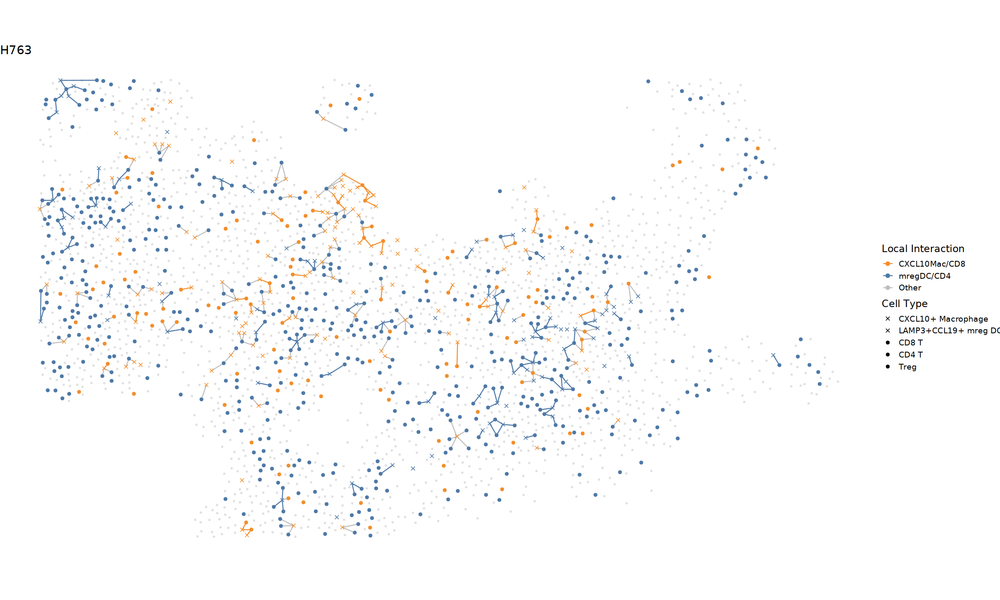

In [17]:
plt = pairs_sf %>% 
    ggplot() + 
        ## BACKGROUND CELLS
        geom_point(
            data = plt_df_all %>% subset(Type == 'Other'), 
            shape = 16, aes(X, Y), alpha = .7, color = 'lightgrey', size = 1
        ) + 
        geom_sf(
            aes(geometry = line, color = `Local Interaction`), linewidth = .5
            # aes(geometry = line, color = celltype_target), linewidth = .4
        ) + 
        geom_point(
            data = plt_df %>% subset(Type %in% c('Target', 'Index')) %>% 
                dplyr::mutate(type_lvl2 = factor(type_lvl2, c('CXCL10+ Macrophage', 'LAMP3+CCL19+ mreg DC', 'CD8 T', 'CD4 T', 'Treg'))), ## fixes order 
            size = 2, aes(X, Y, color = `Local Interaction`, shape = type_lvl2)
        ) + 
        # ## INDEX CELLS
        # geom_point(
        #     data = plt_df %>% subset(Type == 'Index'), 
        #     shape = 4, aes(X, Y, color = `Local Interaction`), size = 1.5, stroke = 1, alpha = 1
        # ) + 
        # ## TARGET CELLS
        # geom_point(
        #     data = plt_df %>% subset(Type == 'Target'), 
        #     shape = 16, aes(X, Y, color = `Local Interaction`), size = 1.5, alpha = .8
        # ) +     
        ## LINES, COLORED BY TARGET TYPE
        coord_sf() + 
        theme_void(base_size = 14) + 
        scale_color_manual(values = c(
            'mregDC/CD4' = '#4E79A7', 'CD4 T' = '#4E79A7', 'Treg' = '#4E79A7', 'LAMP3+CCL19+ mreg DC' = '#4E79A7', 
            'CXCL10Mac/CD8' = '#F28E2B', 'CD8 T' = '#F28E2B', 'CXCL10+ Macrophage' = '#F28E2B',
            'Other' = 'grey'
        )) + 
        scale_shape_manual(values = c(
            'CD8 T' = 16, 'CD4 T' = 16, 'Treg' = 16,
            'LAMP3+CCL19+ mreg DC' = 4, 'CXCL10+ Macrophage' = 4
        )) + 
        # scale_color_manual(values = c(
        #     'LAMP3+CCL19+ mreg DC' = 'blue', 'CXCL10+ Macrophage' = 'red',
        #     'CD4/Treg' = 'blue', 
        #     # 'Treg' = 'blue', 'CD4 T' = 'blue', 
        #     'CD8' = 'red'
        #     # 'CD8 T' = 'red' ## No ILCs
        #     # 'CD8/ILC' = 'red', 'CD8 T' = 'red', 'ILC' = 'red'
        # )) + 
        labs(title = hub_plot) + 
        # xlim(2600, 3300) + ylim(5000, 5400) + 
        # scale_color_tableau() + 
        labs(shape = 'Cell Type') + 
        NULL
plot(plt)
# })


In [18]:
ggsave('figures/local_interactions_lines_and_points.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 12, width = 20)
ggsave('figures/local_interactions_lines_and_points.png', plt, device = 'png', dpi = 300, units = 'in', height = 12, width = 20)


In [19]:
# .pal = pal$type_lvl2[c('LAMP3+CCL19+ mreg DC', 'CXCL10+ Macrophage', 'CD8 T', 'Treg', 'CD4 T')]
# .pal['Other'] = 'lightgrey'

# fig.size(10, 20)
# cells$meta_data[
#     hubID %in% c('H1427')
#     # hubID %in% hubs_plot
# ][
#     , LABEL := case_when(
#         type_lvl2 %in% c('Treg', 'CD4 T') ~ 'CD4/Treg',
#         type_lvl2 %in% c('CD8 T', 'ILC') ~ 'CD8/ILC',
#         # type_lvl2 %in% c('TCF7+ CD8 T') ~ 'TCF7+ CD8 T', 
#         type_lvl2 %in% c('LAMP3+CCL19+ mreg DC', 'CXCL10+ Macrophage') ~ type_lvl2, 
#         TRUE ~ 'Other'
#     )
# ][
#     LABEL != 'Other'
# ] %>% 
#     ggplot(aes(X, Y)) + 
#         geom_point(
#             data = . %>% subset(LABEL %in% c('LAMP3+CCL19+ mreg DC', 'CXCL10+ Macrophage')), 
#             shape = 21, aes(color = LABEL), size = 2, stroke = 2, alpha = .5
#         ) + 
#         geom_point(
#             data = . %>% subset(LABEL %in% c('CD4/Treg', 'CD8/ILC')), 
#             shape = 16, aes(color = LABEL), size = .5
#         ) +         
# # geom_point(shape = 16, aes(color = LABEL)) + 
#         # facet_wrap(~LABEL %in% c('CD4/Treg', 'LAMP3+CCL19+ mreg DC'), scales = 'free') + 
#         # facet_wrap(~hubID, scales = 'free') + 
#         # scale_color_manual(values = .pal) + 
#         scale_color_tableau() + 
#         NULL



## B cells in space: not aggregates! 

In [20]:
fig.size(12, 20)
# .x = map('H763', function(hub_plot) {

hub_plot = 'H763'    
# .x = map(hubs_plot, function(hub_plot) {
# message(hub_plot)
plt_df_all = cells$meta_data[
    # hubID %in% c('H763')
    # hubID %in% c('H1427')
    hubID %in% hub_plot
    # hubID %in% hubs_plot
][
    # between(X, 2600, 3300) & between(Y, 5000, 5400)
][
    , `:=`(
        # `Local Interaction` = case_when(
        #     type_lvl2 %in% c('Treg', 'CD4 T', 'LAMP3+CCL19+ mreg DC') ~ 'mregDC/CD4',
        #     type_lvl2 %in% c('CD8 T', 'CXCL10+ Macrophage') ~ 'CXCL10Mac/CD8',
        #     TRUE ~ 'Other'
        # ),
        Type = case_when(
            type_lvl2 %in% c('B') ~ 'B cell',
            TRUE ~ 'Other'
        )
    )
    # , LABEL := case_when(
    #     type_lvl2 %in% c('Treg', 'CD4 T') ~ 'CD4/Treg',
    #     type_lvl2 %in% c('CD8 T') ~ 'CD8',
    #     # type_lvl2 %in% c('CD8 T', 'ILC') ~ 'CD8/ILC',
    #     # type_lvl2 %in% c('TCF7+ CD8 T') ~ 'TCF7+ CD8 T', 
    #     type_lvl2 %in% c('LAMP3+CCL19+ mreg DC', 'CXCL10+ Macrophage') ~ type_lvl2, 
    #     TRUE ~ 'Other'
    # )
]

## Compute neighbors only with cells of interest? 
plt_df = plt_df_all#[LABEL != 'Other'] 
head(plt_df)

cell,library,X,Y,ntx,ngene,nblank,type_lvl1,type_lvl2,UMAP1_all,UMAP2_all,UMAP1_immune,UMAP2_immune,hubID,hubType,Type
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
306505,Patient001,2248.412,4669.515,16,14,0,Myeloid,MERTK+ Macrophage,-1.2111932,0.9555026,-1.1671852,-0.26071298,H763,hybrid_hub,Other
306506,Patient001,2197.063,4677.572,11,9,0,Fibroblast,Fibroblast,-0.7392476,-0.6463868,NA,NA,H763,hybrid_hub,Other
306508,Patient001,2164.994,4704.262,24,19,1,Fibroblast,Fibroblast,-0.8480687,-0.5922319,NA,NA,H763,hybrid_hub,Other
306509,Patient001,2231.526,4720.100,19,17,0,Lymphocyte,Treg,-1.4825875,0.1696942,0.4896647,-0.08845245,H763,hybrid_hub,Other
306511,Patient001,2179.337,4746.817,16,11,0,Fibroblast,Fibroblast,-0.5148202,-0.3999578,NA,NA,H763,hybrid_hub,Other
306515,Patient001,2222.079,4628.884,11,8,0,,,-1.5141390,0.0897357,NA,NA,H763,hybrid_hub,Other


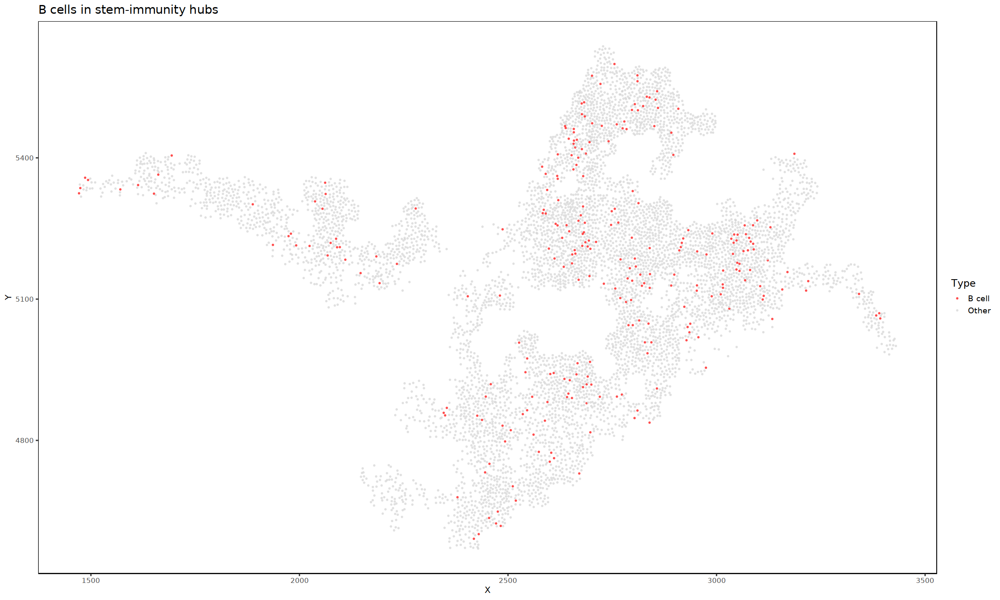

In [21]:
fig.size(12, 20)
plt = plt_df %>% 
    ggplot() + 
        ## BACKGROUND CELLS
        geom_point(
            # data = plt_df_all %>% subset(Type == 'Other'), 
            shape = 16, aes(X, Y, color = Type), alpha = .7, size = 1
        ) + 
        scale_color_manual(values = list('red', 'lightgrey')) + 
        labs(title = 'B cells in stem-immunity hubs') + 
        NULL

plt

In [22]:
# cells$markers_lvl2[cluster == 'B'][order(-zscore)]
cells$markers_lvl2[feature == 'MKI67'][order(-zscore)]



cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CXCL13+ CD8 T,MKI67,3.42158979,0.4043227,8.46252233,1.308278e-17,3.253839e-15
Epithelial,MKI67,2.51247581,0.6512075,3.85817980,5.711730e-05,1.575049e-03
CD8 T,MKI67,2.10045881,0.6334852,3.31571874,4.570389e-04,9.221347e-03
Treg,MKI67,1.76034908,0.6573276,2.67803921,3.702727e-03,5.216489e-02
Vascular,MKI67,0.64121880,0.4271981,1.50098699,6.667946e-02,4.772360e-01
Plasma,MKI67,0.97540452,0.6509575,1.49841518,6.701271e-02,4.790909e-01
PLA2G7+ CCL18+ Macrophage,MKI67,0.44142793,0.3987602,1.10700099,1.341468e-01,7.484555e-01
CD1C+ITGAX+ DC,MKI67,0.38636493,0.4107835,0.94055600,1.734662e-01,8.718262e-01
FCN1+LYZ+ Macrophage,MKI67,0.01964287,0.6657660,0.02950416,4.882312e-01,1.000000e+00


In [23]:
ggsave('figures/bcells_inhub763.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 12, width = 20)
ggsave('figures/bcells_inhub763.png', plt, device = 'png', dpi = 300, units = 'in', height = 12, width = 20)


# Supp: OR enrichment: cells vs hubs (by hubs)

In [41]:
library(stringr)

In [61]:
df_mean = fread('data/df_hub_means_props.csv')
df_mean$type_lvl2[df_mean$type_lvl2 == 'CD4 T'] = 'TCF7- CD4 T'
df_mean$type_lvl2[df_mean$type_lvl2 == 'CD8 T'] = 'TCF7- CD8 T'
df_mean$type_lvl2[df_mean$type_lvl2 == 'ILC'] = 'Tgd/innate-like'

df_mean = df_mean %>% dplyr::mutate(type_lvl2 = str_wrap(type_lvl2, 15)) 


## convert from cells per tile to cells per mm2
df_mean$mu = df_mean$mu * (1e6 / 2500)


df_mean = bind_rows(
    df_mean, 
    df_mean[, .(type_lvl2 = 'All', mu = sum(mu), sigma = NA), by = .(hubType, library)][
        , .(hubType, type_lvl2, library, mu, sigma)
    ]
)
    

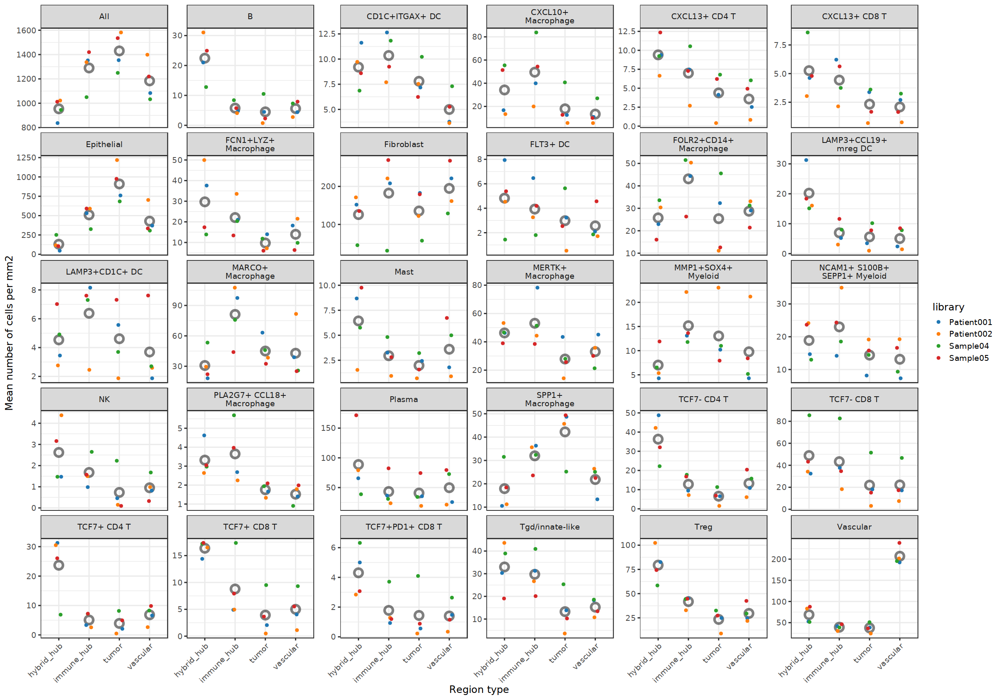

In [62]:
plt = df_mean %>% 
    ggplot(aes(hubType, mu, color = library)) + 
        geom_point(
            data = df_mean[, .(mu = mean(mu)), by = .(hubType, type_lvl2)], 
            color = 'black', size = 4, shape = 21, alpha = .5, stroke = 2
        ) + 
        geom_point(position = position_jitter(width = .1, height = 0)) + 
        # geom_line(aes(group = library), alpha = .3) + 
        facet_wrap(~type_lvl2, scales = 'free_y') + 
        theme_bw(base_size = 14) + 
        theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
        labs(x = 'Region type', y = 'Mean number of cells per mm2') + 
        # scale_color_tableau() + 
        scale_color_manual(values = pal$library) + 
        NULL
fig.size(14, 20)
plt

In [63]:
ggsave('figures/s9f_enrichment_celltypes_in_hubs_supp.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 14, width = 20)
ggsave('figures/s9f_enrichment_celltypes_in_hubs_supp.png', plt, device = 'png', dpi = 300, units = 'in', height = 14, width = 20)


# Supp: OR enrichment: cells vs hubs (by tiles)

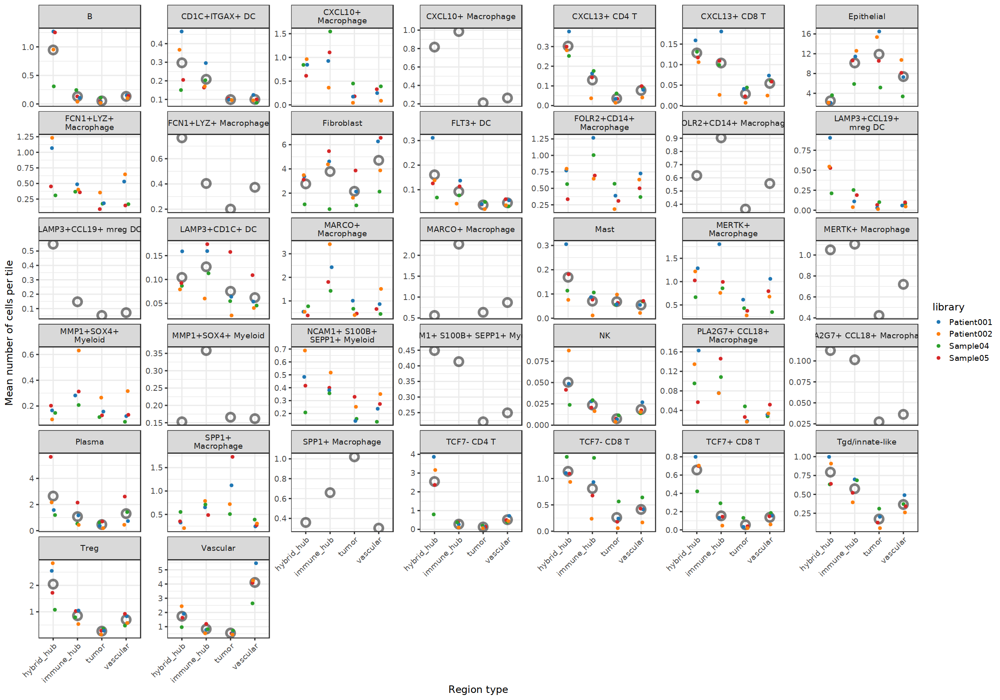

In [46]:
df_mean = fread('data/df_tile_means_props.csv')
df_mean$type_lvl2[df_mean$type_lvl2 == 'CD4 T'] = 'TCF7- CD4 T'
df_mean$type_lvl2[df_mean$type_lvl2 == 'CD8 T'] = 'TCF7- CD8 T'
df_mean$type_lvl2[df_mean$type_lvl2 == 'ILC'] = 'Tgd/innate-like'

plt = df_mean %>% 
    dplyr::mutate(type_lvl2 = str_wrap(type_lvl2, 15)) %>% 
    ggplot(aes(hubType, mu, color = library)) + 
        geom_point(
            data = df_mean[, .(mu = mean(mu)), by = .(hubType, type_lvl2)], 
            color = 'black', size = 4, shape = 21, alpha = .5, stroke = 2
        ) + 
        geom_point(position = position_jitter(width = .1, height = 0)) + 
        # geom_line(aes(group = library), alpha = .3) + 
        facet_wrap(~type_lvl2, scales = 'free_y') + 
        theme_bw(base_size = 14) + 
        theme(axis.text.x = element_text(angle = 45, hjust = 1)) + 
        labs(x = 'Region type', y = 'Mean number of cells per tile') + 
        # scale_color_tableau() + 
        scale_color_manual(values = pal$library) + 
        NULL
fig.size(14, 20)
plt

In [47]:
ggsave('figures/s9f_enrichment_celltypes_in_tiles_supp.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 14, width = 20)
ggsave('figures/s9f_enrichment_celltypes_in_tiles_supp.png', plt, device = 'png', dpi = 300, units = 'in', height = 14, width = 20)


# Supp: OR enrichment: stats (by hubs)

In [52]:
stats = fread('tables/hub_cell_enrichment_stats.csv')


In [53]:
stats$type_lvl2[stats$type_lvl2 == 'CD4 T'] = 'TCF7- CD4 T'
stats$type_lvl2[stats$type_lvl2 == 'CD8 T'] = 'TCF7- CD8 T'
stats$type_lvl2[stats$type_lvl2 == 'ILC'] = 'Tgd/innate-like'


In [54]:
stats[
    , type_lvl2 := case_when(
        type_lvl2 == 'FCN1+LYZ+ Macrophage' ~ 'LYZ+ Myeloid',
        TRUE ~ type_lvl2
    )
]

Joining with `by = join_by(comparison)`


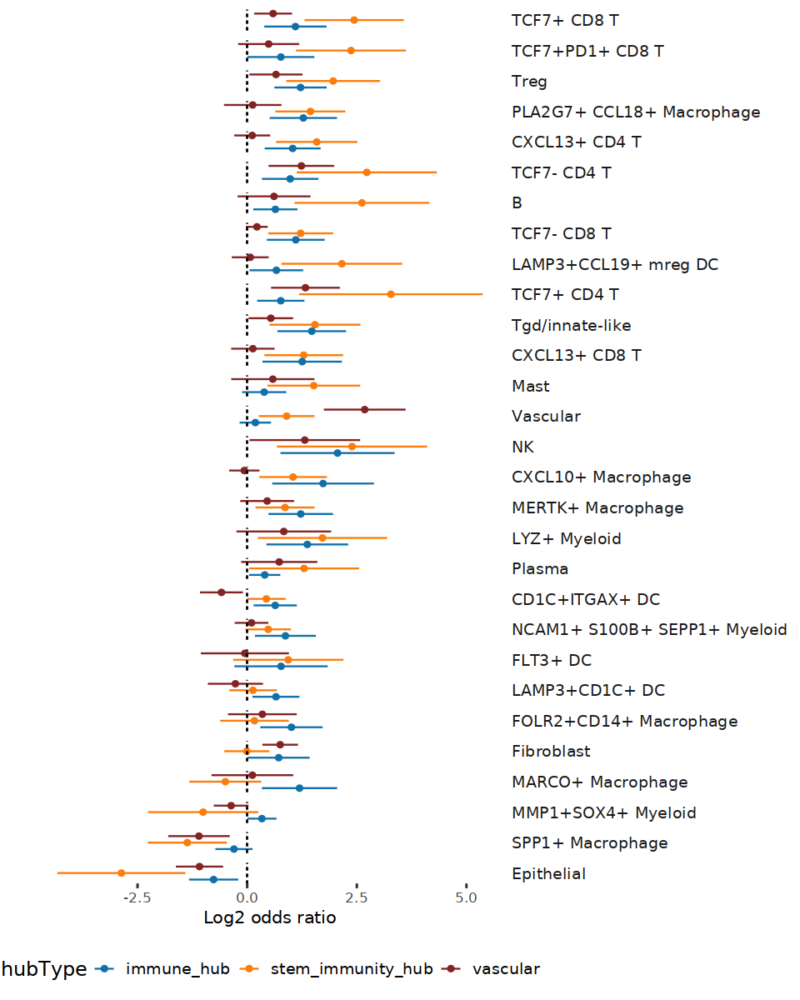

In [55]:
o = stats[comparison == 'hybrid_vs_tumor'][order(-zscore)][, type_lvl2]
plt = stats[
    grepl('vs_tumor', comparison)
] %>% 
    left_join(
        tibble(
            comparison = c('hybrid_vs_tumor', 'immune_vs_tumor', 'vascular_vs_tumor'), 
            hubType = c('stem_immunity_hub', 'immune_hub', 'vascular')    
        )
    ) %>% 
    dplyr::mutate(type_lvl2 = factor(type_lvl2, o)) %>% ## order by hybrid hub significance 
    ggplot(aes(hubType, logOR, color = hubType)) + 
        geom_point() + 
        geom_errorbar(aes(ymin = logOR - 1.96 * SD, ymax = logOR + 1.96 * SD), width = 0) + 
        coord_flip() + 
        facet_grid(type_lvl2 ~ ., space = "free", scales = "free", switch = NULL) + 
        geom_hline(yintercept = c(0), linetype = 2) + 
        labs(x = "", y = "Log2 odds ratio") + 
        geom_hline(yintercept = c(0), linetype = 2) + 
        theme(
            axis.text.y = element_blank(), 
            axis.ticks.y = element_blank(),
            legend.position = "bottom",
            strip.text.y = element_text(angle = 0, hjust = 0), 
            panel.background = element_blank()
        ) + 
        scale_color_manual(values = pal$hubType) + 
        NULL      
        
fig.size(10, 8)
plt

In [56]:
ggsave('figures/s9b_enrichment_celltypes_in_hubs_forest.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 10, width = 8)
ggsave('figures/s9b_enrichment_celltypes_in_hubs_forest.png', plt, device = 'png', dpi = 300, units = 'in', height = 10, width = 8)


# Supp: OR enrichment: stats (by tiles)

In [57]:
stats = fread('tables/tile_cell_enrichment_stats.csv')
stats$type_lvl2[stats$type_lvl2 == 'CD4 T'] = 'TCF7- CD4 T'
stats$type_lvl2[stats$type_lvl2 == 'CD8 T'] = 'TCF7- CD8 T'
stats$type_lvl2[stats$type_lvl2 == 'ILC'] = 'Tgd/innate-like'


In [58]:
stats[
    , type_lvl2 := case_when(
        type_lvl2 == 'FCN1+LYZ+ Macrophage' ~ 'LYZ+ Myeloid',
        TRUE ~ type_lvl2
    )
]

Joining with `by = join_by(comparison)`


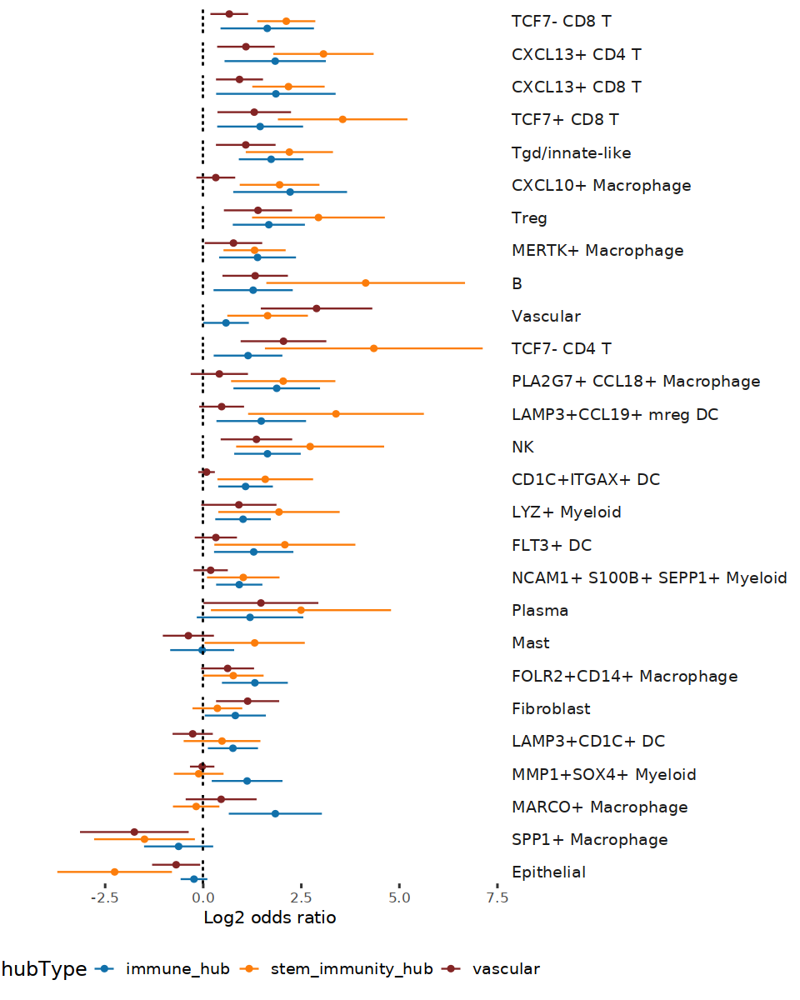

In [59]:
o = stats[comparison == 'hybrid_vs_tumor'][order(-zscore)][, type_lvl2]
plt = stats[
    grepl('vs_tumor', comparison)
] %>% 
    left_join(
        tibble(
            comparison = c('hybrid_vs_tumor', 'immune_vs_tumor', 'vascular_vs_tumor'), 
            hubType = c('stem_immunity_hub', 'immune_hub', 'vascular')    
        )
    ) %>% 
    dplyr::mutate(type_lvl2 = factor(type_lvl2, o)) %>% ## order by hybrid hub significance 
    ggplot(aes(hubType, logOR, color = hubType)) + 
        geom_point() + 
        geom_errorbar(aes(ymin = logOR - 1.96 * SD, ymax = logOR + 1.96 * SD), width = 0) + 
        coord_flip() + 
        facet_grid(type_lvl2 ~ ., space = "free", scales = "free", switch = NULL) + 
        geom_hline(yintercept = c(0), linetype = 2) + 
        labs(x = "", y = "Log2 odds ratio") + 
        geom_hline(yintercept = c(0), linetype = 2) + 
        theme(
            axis.text.y = element_blank(), 
            axis.ticks.y = element_blank(),
            legend.position = "bottom",
            strip.text.y = element_text(angle = 0, hjust = 0), 
            panel.background = element_blank()
        ) + 
        scale_color_manual(values = pal$hubType) + 
        NULL      
        
fig.size(10, 8)
plt

In [60]:
ggsave('figures/s9b_enrichment_celltypes_in_tiles_forest.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 10, width = 8)
ggsave('figures/s9b_enrichment_celltypes_in_tiles_forest.png', plt, device = 'png', dpi = 300, units = 'in', height = 10, width = 8)


# Main: OR enrichment (by hub)

In [64]:
stats = fread('tables/hub_cell_enrichment_stats.csv')
stats$type_lvl2[stats$type_lvl2 == 'CD4 T'] = 'TCF7- CD4 T'
stats$type_lvl2[stats$type_lvl2 == 'CD8 T'] = 'TCF7- CD8 T'
stats$type_lvl2[stats$type_lvl2 == 'ILC'] = 'Tgd/innate-like'

fdr_t = .2
logOR_t = .5

## Hybrid: Up vs tumor and vs immunity 
## Lots of things unique to stem-immunity 
up_in_hybrid = intersect(
    stats[comparison == 'hybrid_vs_tumor'][fdr < fdr_t & logOR > logOR_t, type_lvl2],
    stats[comparison == 'hybrid_vs_immunity'][fdr < fdr_t & logOR > logOR_t, type_lvl2]
)

## Immunity: Up vs tumor and vs immunity 
## Nothing unique to stem hub! 
up_in_immunity = intersect(
    stats[comparison == 'immune_vs_tumor'][fdr < fdr_t & logOR > logOR_t, type_lvl2],
    stats[comparison == 'hybrid_vs_immunity'][fdr < fdr_t & logOR < -logOR_t, type_lvl2]
)

## Up in both: things that are up in both and not unique to one
up_in_both = intersect(
    stats[comparison == 'hybrid_vs_tumor'][fdr < fdr_t & logOR > logOR_t, type_lvl2],
    stats[comparison == 'immune_vs_tumor'][fdr < fdr_t & logOR > logOR_t, type_lvl2]
) %>% 
    setdiff(up_in_hybrid) %>% 
    setdiff(up_in_immunity)


up_in_hybrid
up_in_immunity
up_in_both


[1] "TCF7+ CD4 T"          "TCF7- CD4 T"          "B"                   
[4] "TCF7+ CD8 T"          "TCF7+PD1+ CD8 T"      "LAMP3+CCL19+ mreg DC"
[7] "Treg"                 "Vascular"

[1] "MARCO+ Macrophage"      "FOLR2+CD14+ Macrophage"

[1] "NK"                        "CXCL13+ CD4 T"            
[3] "Tgd/innate-like"           "PLA2G7+ CCL18+ Macrophage"
[5] "CXCL13+ CD8 T"             "TCF7- CD8 T"              
[7] "CXCL10+ Macrophage"        "MERTK+ Macrophage"

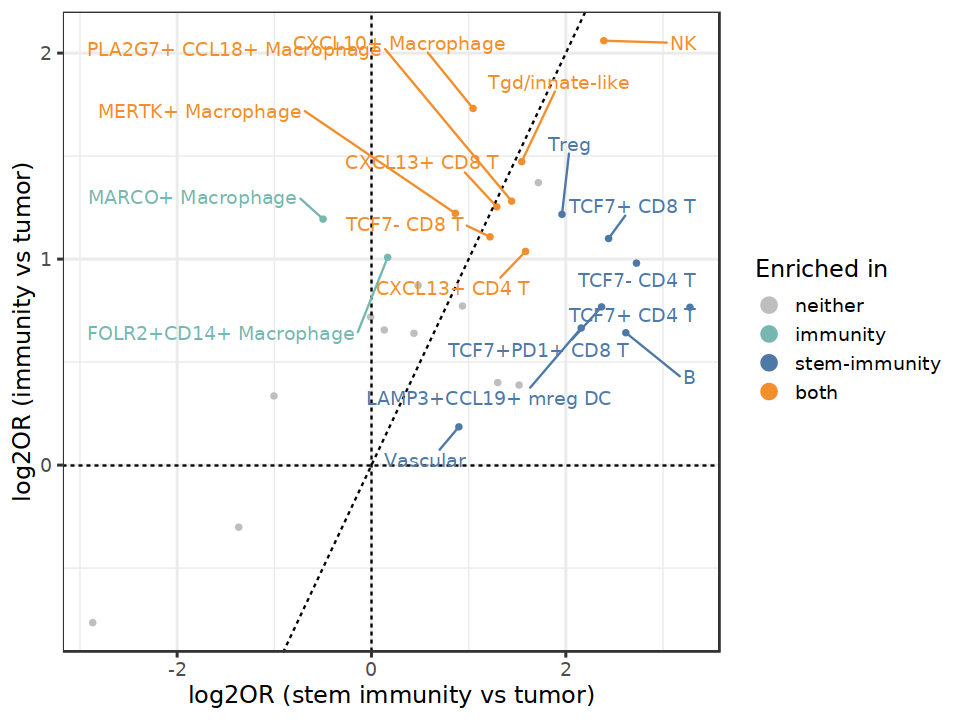

In [65]:
plt = full_join(
    stats[comparison == 'hybrid_vs_tumor'],
    # hybrid_vs_tumor,
    stats[comparison == 'immune_vs_tumor'],
    # immune_vs_tumor,
    by = c('type_lvl2'), 
    suffix = c('_hybrid', '_immunity')
) %>% 
    dplyr::mutate(LABEL = case_when(
        type_lvl2 %in% up_in_both ~ 'both', 
        type_lvl2 %in% up_in_hybrid ~ 'stem-immunity', 
        type_lvl2 %in% up_in_immunity ~ 'immunity', 
        # (fdr_immunity < fdr_t & logOR_immunity > 0) | (fdr_hybrid < fdr_t & logOR_hybrid > 0) ~ 'significant', 
        TRUE ~ 'neither'
    )) %>% 
    dplyr::mutate(LABEL = factor(LABEL, c('neither', 'immunity', 'stem-immunity', 'both'))) %>% 
    ggplot(aes(logOR_hybrid, logOR_immunity, color = LABEL)) + 
        geom_point(shape = 16) + 
        geom_hline(yintercept = 0, linetype = 2) + 
        geom_vline(xintercept = 0, linetype = 2) + 
        labs(
            x = 'log2OR (stem immunity vs tumor)', 
            y = 'log2OR (immunity vs tumor)', 
            color = 'Enriched in'
        ) + 
        geom_abline(linetype = 2) + 
        # geom_errorbar(
        #     aes(ymin = logOR_immunity - 1.96 * SD_immunity, ymax = logOR_immunity + 1.96 * SD_immunity),
        #     data = . %>% subset(LABEL == 'significant'),             
        #     alpha = .3
        # ) + 
        # geom_errorbarh(
        #     aes(xmin = logOR_hybrid - 1.96 * SD_hybrid, xmax = logOR_hybrid + 1.96 * SD_hybrid),
        #     data = . %>% subset(LABEL == 'significant'), 
        #     alpha = .3
        # ) + 
        geom_text_repel(
            aes(label = type_lvl2), 
            # data = . %>% subset((fdr_immunity < fdr_t & logOR_immunity > 0) | (fdr_hybrid < fdr_t & logOR_hybrid > 0)), 
            data = . %>% subset(LABEL %in% c('both', 'stem-immunity', 'immunity')), 
            # data = . %>% subset(LABEL == 'significant'), 
            box.padding = 1, 
            # point.padding = 1, 
            # color = 'red',
            max.overlaps = Inf
        ) + 
        theme_bw(base_size = 14) + 
        # scale_color_manual(values = c('not' = 'black', 'significant' = 'red')) + 
        # scale_color_manual(values = c('neither' = 'grey', 'stem-immunity' = muted('red'), 'both' = muted('blue'))) + 
        scale_color_manual(values = c(neither = 'gray', 'stem-immunity' = '#4E79A7', 'both' = '#F28E2B', 'immunity' = '#76B7B2')) + 
        # guides(color = 'none') + 

        guides(color = guide_legend(override.aes = list(stroke = 1, alpha = 1, shape = 16, size = 4)), alpha = "none") +   
    
        ## OPTIONAL: display odds ratios, rather log odds
        # scale_x_continuous(breaks = seq(-3, 3, 1),labels = 2 ^ seq(-3, 3, 1)) + 
        # scale_y_continuous(breaks = seq(-3, 3, 1),labels = 2 ^ seq(-3, 3, 1)) + 
        # xlim(-3, 3) + ylim(-3, 3) + 
        NULL

fig.size(6, 8)
plt


In [66]:
ggsave('figures/5d_enrichment_celltypes_in_hubs_main.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 6, width = 8)
ggsave('figures/5d_enrichment_celltypes_in_hubs_main.png', plt, device = 'png', dpi = 300, units = 'in', height = 6, width = 8)


# Main: OR enrichment (by tile)

In [67]:
stats = fread('tables/tile_cell_enrichment_stats.csv')
stats$type_lvl2[stats$type_lvl2 == 'CD4 T'] = 'TCF7- CD4 T'
stats$type_lvl2[stats$type_lvl2 == 'CD8 T'] = 'TCF7- CD8 T'
stats$type_lvl2[stats$type_lvl2 == 'ILC'] = 'Tgd/innate-like'

fdr_t = .3
logOR_t = 1

## Hybrid: Up vs tumor and vs immunity 
## Lots of things unique to stem-immunity 
up_in_hybrid = intersect(
    stats[comparison == 'hybrid_vs_tumor'][fdr < fdr_t & logOR > logOR_t, type_lvl2],
    stats[comparison == 'hybrid_vs_immunity'][fdr < fdr_t & logOR > logOR_t, type_lvl2]
)

## Immunity: Up vs tumor and vs immunity 
## Nothing unique to stem hub! 
up_in_immunity = intersect(
    stats[comparison == 'immune_vs_tumor'][fdr < fdr_t & logOR > logOR_t, type_lvl2],
    stats[comparison == 'hybrid_vs_immunity'][fdr < fdr_t & logOR < -logOR_t, type_lvl2]
)

## Up in both: things that are up in both and not unique to one
up_in_both = intersect(
    stats[comparison == 'hybrid_vs_tumor'][fdr < fdr_t & logOR > logOR_t, type_lvl2],
    stats[comparison == 'immune_vs_tumor'][fdr < fdr_t & logOR > logOR_t, type_lvl2]
) %>% 
    setdiff(up_in_hybrid) %>% 
    setdiff(up_in_immunity)


up_in_hybrid
up_in_immunity
up_in_both


[1] "TCF7- CD4 T"          "B"                    "TCF7+ CD8 T"         
[4] "LAMP3+CCL19+ mreg DC" "CXCL13+ CD4 T"        "Treg"                
[7] "Vascular"

[1] "MARCO+ Macrophage"

[1] "NK"                        "Tgd/innate-like"          
 [3] "CXCL13+ CD8 T"             "TCF7- CD8 T"              
 [5] "FLT3+ DC"                  "PLA2G7+ CCL18+ Macrophage"
 [7] "CXCL10+ Macrophage"        "FCN1+LYZ+ Macrophage"     
 [9] "CD1C+ITGAX+ DC"            "MERTK+ Macrophage"

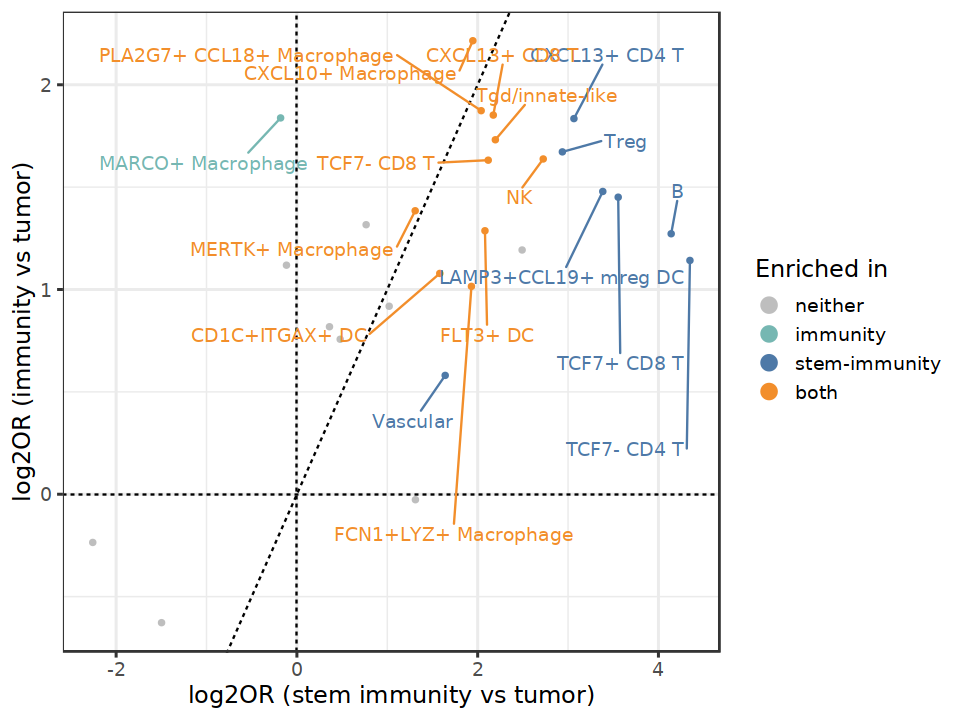

In [68]:
plt = full_join(
    stats[comparison == 'hybrid_vs_tumor'],
    # hybrid_vs_tumor,
    stats[comparison == 'immune_vs_tumor'],
    # immune_vs_tumor,
    by = c('type_lvl2'), 
    suffix = c('_hybrid', '_immunity')
) %>% 
    dplyr::mutate(LABEL = case_when(
        type_lvl2 %in% up_in_both ~ 'both', 
        type_lvl2 %in% up_in_hybrid ~ 'stem-immunity', 
        type_lvl2 %in% up_in_immunity ~ 'immunity', 
        # (fdr_immunity < fdr_t & logOR_immunity > 0) | (fdr_hybrid < fdr_t & logOR_hybrid > 0) ~ 'significant', 
        TRUE ~ 'neither'
    )) %>% 
    dplyr::mutate(LABEL = factor(LABEL, c('neither', 'immunity', 'stem-immunity', 'both'))) %>% 
    ggplot(aes(logOR_hybrid, logOR_immunity, color = LABEL)) + 
        geom_point(shape = 16) + 
        geom_hline(yintercept = 0, linetype = 2) + 
        geom_vline(xintercept = 0, linetype = 2) + 
        labs(
            x = 'log2OR (stem immunity vs tumor)', 
            y = 'log2OR (immunity vs tumor)', 
            color = 'Enriched in'
        ) + 
        geom_abline(linetype = 2) + 
        # geom_errorbar(
        #     aes(ymin = logOR_immunity - 1.96 * SD_immunity, ymax = logOR_immunity + 1.96 * SD_immunity),
        #     data = . %>% subset(LABEL == 'significant'),             
        #     alpha = .3
        # ) + 
        # geom_errorbarh(
        #     aes(xmin = logOR_hybrid - 1.96 * SD_hybrid, xmax = logOR_hybrid + 1.96 * SD_hybrid),
        #     data = . %>% subset(LABEL == 'significant'), 
        #     alpha = .3
        # ) + 
        geom_text_repel(
            aes(label = type_lvl2), 
            # data = . %>% subset((fdr_immunity < fdr_t & logOR_immunity > 0) | (fdr_hybrid < fdr_t & logOR_hybrid > 0)), 
            data = . %>% subset(LABEL %in% c('both', 'stem-immunity', 'immunity')), 
            # data = . %>% subset(LABEL == 'significant'), 
            box.padding = 1.5, 
            # point.padding = 1, 
            # color = 'red',
            max.overlaps = Inf
        ) + 
        theme_bw(base_size = 14) + 
        # scale_color_manual(values = c('not' = 'black', 'significant' = 'red')) + 
        # scale_color_manual(values = c('neither' = 'grey', 'stem-immunity' = muted('red'), 'both' = muted('blue'))) + 
        scale_color_manual(values = c(neither = 'gray', 'stem-immunity' = '#4E79A7', 'both' = '#F28E2B', 'immunity' = '#76B7B2')) + 
        # guides(color = 'none') + 

        guides(color = guide_legend(override.aes = list(stroke = 1, alpha = 1, shape = 16, size = 4)), alpha = "none") +   
    
        ## OPTIONAL: display odds ratios, rather log odds
        # scale_x_continuous(breaks = seq(-3, 3, 1),labels = 2 ^ seq(-3, 3, 1)) + 
        # scale_y_continuous(breaks = seq(-3, 3, 1),labels = 2 ^ seq(-3, 3, 1)) + 
        # xlim(-3, 3) + ylim(-3, 3) + 
        NULL

fig.size(6, 8)
plt


In [69]:
ggsave('figures/5d_enrichment_celltypes_in_tiles_main.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 6, width = 8)
ggsave('figures/5d_enrichment_celltypes_in_tiles_main.png', plt, device = 'png', dpi = 300, units = 'in', height = 6, width = 8)


# Cell batch barplots

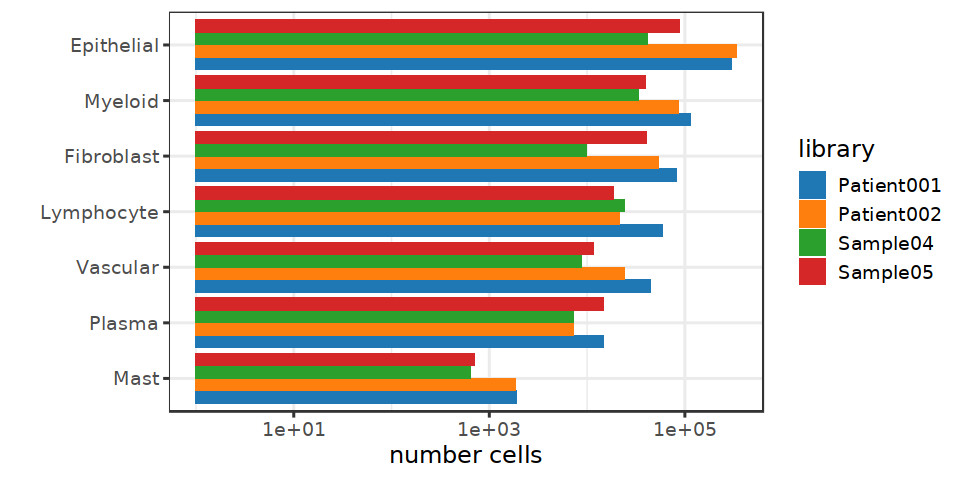

In [42]:
fig.size(4, 8)
plt = cells$meta_data %>% 
    subset(type_lvl1 != '') %>% 
    with(table(type_lvl1, library)) %>% 
    data.table() %>% 
    ggplot(aes(reorder(type_lvl1, N), N, fill = library)) + 
        geom_bar(stat = 'identity', position = position_dodge()) + 
        # scale_fill_tableau() + 
        scale_fill_manual(values = pal$library) + 
        coord_flip() + 
        scale_y_log10() + 
        theme_bw(base_size = 14) + 
        labs(y = 'number cells', x = '') + 
        NULL
plt


In [43]:
ggsave('figures/S9b_barplots_cell_batches_coarse.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 4, width = 8)
ggsave('figures/S9b_barplots_cell_batches_coarse.png', plt, device = 'png', dpi = 300, units = 'in', height = 4, width = 8)


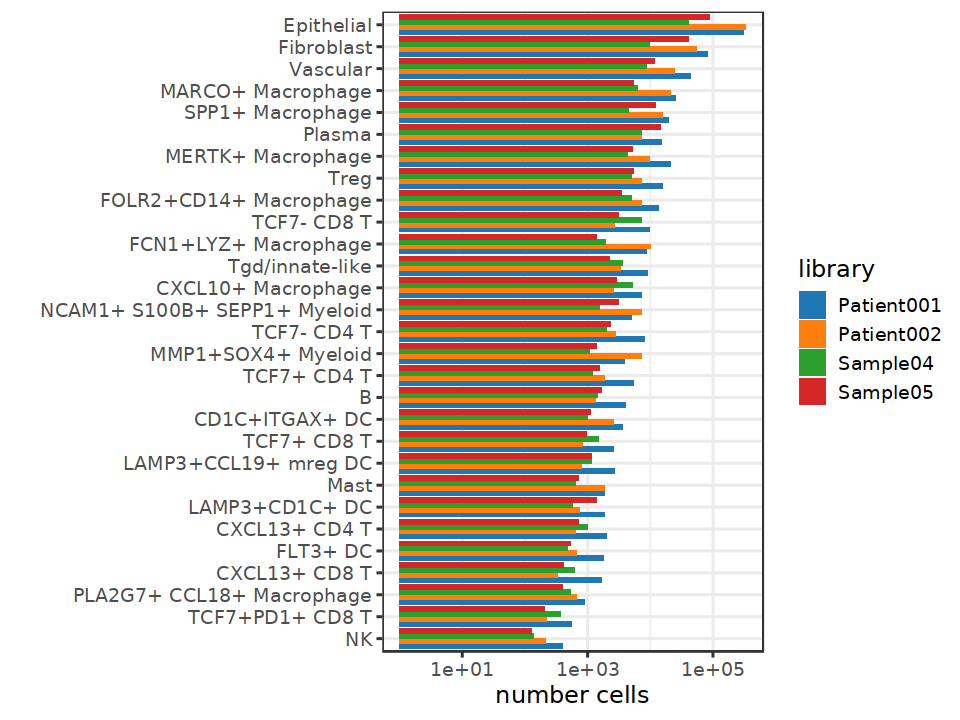

In [70]:
fig.size(6, 8)
plt = cells$meta_data %>% 
    subset(type_lvl2 != '') %>% 
    with(table(type_lvl2, library)) %>% 
    data.table() %>% 
    ggplot(aes(reorder(type_lvl2, N), N, fill = library)) + 
        geom_bar(stat = 'identity', position = position_dodge()) + 
        scale_fill_manual(values = pal$library) + 
        # scale_fill_tableau() + 
        coord_flip() + 
        scale_y_log10() + 
        theme_bw(base_size = 14) + 
        labs(y = 'number cells', x = '') + 
        NULL
plt


In [71]:
ggsave('figures/s9d_barplots_cell_batches_fine.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 6, width = 8)
ggsave('figures/s9d_barplots_cell_batches_fine.png', plt, device = 'png', dpi = 300, units = 'in', height = 6, width = 8)


# Cell type UMAPs

## All cells

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.”
Warning message in geom_point(...):
“Ignoring unknown parameters: `width` and `height`”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


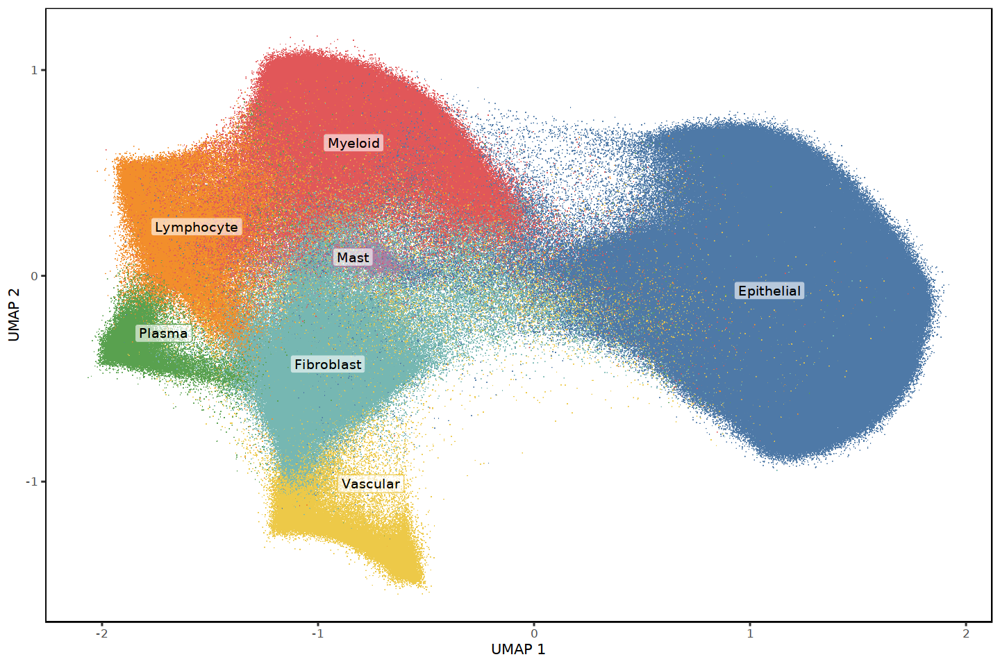

In [46]:
fig.size(8, 12)
i = which(!is.na(cells$meta_data$type_lvl1) & cells$meta_data$type_lvl1 != '')
# i = sample(setdiff(seq_len(nrow(meta_data)), which(is.na(meta_data$type_lvl1))), 1e5)
plt = do_scatter(
    # cells$U2$embedding[i, ], cells$meta_data[i, ], 
    dplyr::select(cells$meta_data, UMAP1_all, UMAP2_all)[i, ], 
    dplyr::select(cells$meta_data, -UMAP1_all, -UMAP2_all)[i, ], 
    'type_lvl1', do_labels = TRUE, do_raster = TRUE, palette_use = pal$type_lvl1
)  + 
    scale_color_manual(values = pal$type_lvl1) ## do_scatter doesn't keep order of palette names
plt


ggsave('figures/5a_umap_cells_coarse.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 8, width = 12)
ggsave('figures/5a_umap_cells_coarse.png', plt, device = 'png', dpi = 300, units = 'in', height = 8, width = 12)


Warning message in geom_point(...):
“Ignoring unknown parameters: `width` and `height`”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


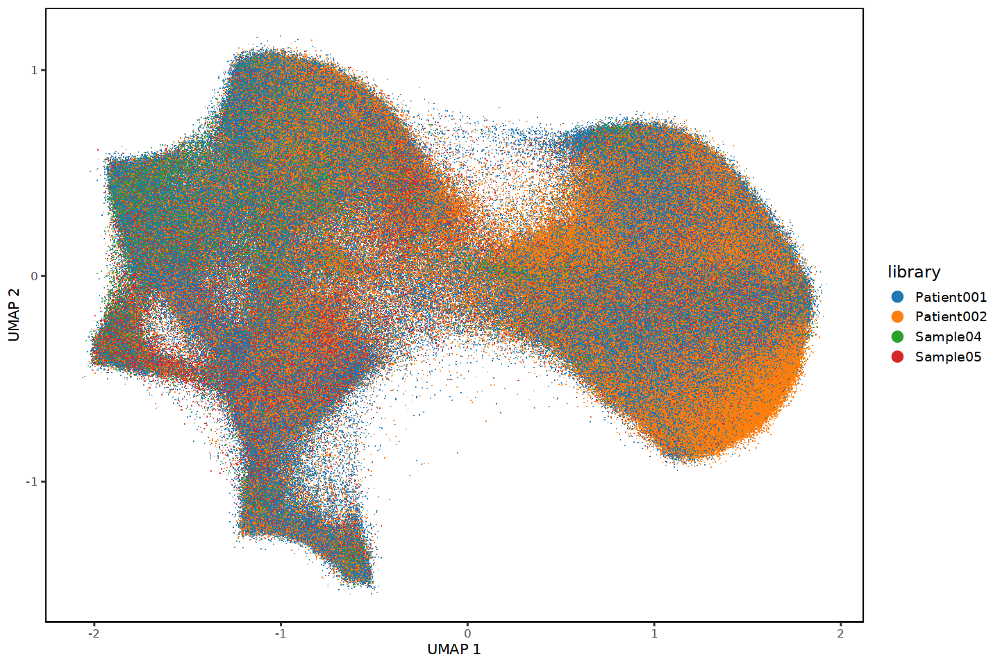

In [47]:
fig.size(8, 12)
i = which(!is.na(cells$meta_data$type_lvl1) & cells$meta_data$type_lvl1 != '')
# i = sample(setdiff(seq_len(nrow(meta_data)), which(is.na(meta_data$type_lvl1))), 1e5)
plt = do_scatter(
    dplyr::select(cells$meta_data, UMAP1_all, UMAP2_all)[i, ],
    dplyr::select(cells$meta_data, -UMAP1_all, -UMAP2_all)[i, ],
    # cells$U2$embedding[i, ], cells$meta_data[i, ], 
    'library', do_labels = FALSE, do_raster = TRUE, no_guides = FALSE, 
    palette_use = pal$library
    # palette_use = tableau_color_pal('Tableau 10')(4)
)  + 
    scale_color_manual(values = pal$library) ## do_scatter doesn't keep order of palette names
plt

ggsave('figures/s9a_umap_batches_coarse.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 8, width = 12)
ggsave('figures/s9a_umap_batches_coarse.png', plt, device = 'png', dpi = 300, units = 'in', height = 8, width = 12)


## Immune cells

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.”
Warning message in geom_point(...):
“Ignoring unknown parameters: `width` and `height`”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Warning message:
“Removed 1090967 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 5 rows containing missing values (`geom_label()`).”
Warning message:
“Removed 5 rows containing missing values (`geom_text()`).”


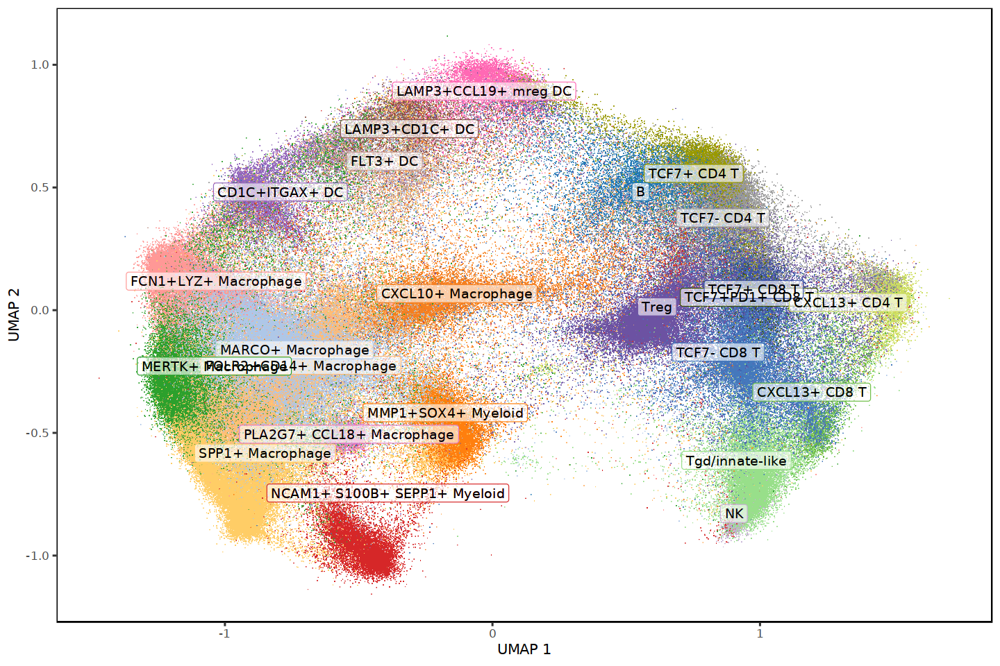

In [72]:
fig.size(8, 12)
i = which(!is.na(cells$meta_data$type_lvl2) & cells$meta_data$type_lvl2 != '')
# i = sample(setdiff(seq_len(nrow(meta_data)), which(is.na(meta_data$type_lvl1))), 1e5)
plt = do_scatter(
    dplyr::select(cells$meta_data, matches('UMAP._immune'))[i, ], 
    dplyr::select(cells$meta_data, !matches('UMAP._immune'))[i, ], 
    'type_lvl2', do_labels = TRUE, do_raster = TRUE, 
    palette_use = pal$type_lvl2
)  + 
    scale_color_manual(values = pal$type_lvl2) ## do_scatter doesn't keep order of palette names
plt


In [73]:
ggsave('figures/5b_umap_cells_fine_immune.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 8, width = 12)
ggsave('figures/5b_umap_cells_fine_immune.png', plt, device = 'png', dpi = 300, units = 'in', height = 8, width = 12)


Warning message:
“Removed 1090967 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 5 rows containing missing values (`geom_label()`).”
Warning message:
“Removed 5 rows containing missing values (`geom_text()`).”
Warning message:
“Removed 1090967 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 5 rows containing missing values (`geom_label()`).”
Warning message:
“Removed 5 rows containing missing values (`geom_text()`).”


Warning message in geom_point(...):
“Ignoring unknown parameters: `width` and `height`”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Warning message:
“Removed 1090967 rows containing missing values (`geom_point()`).”


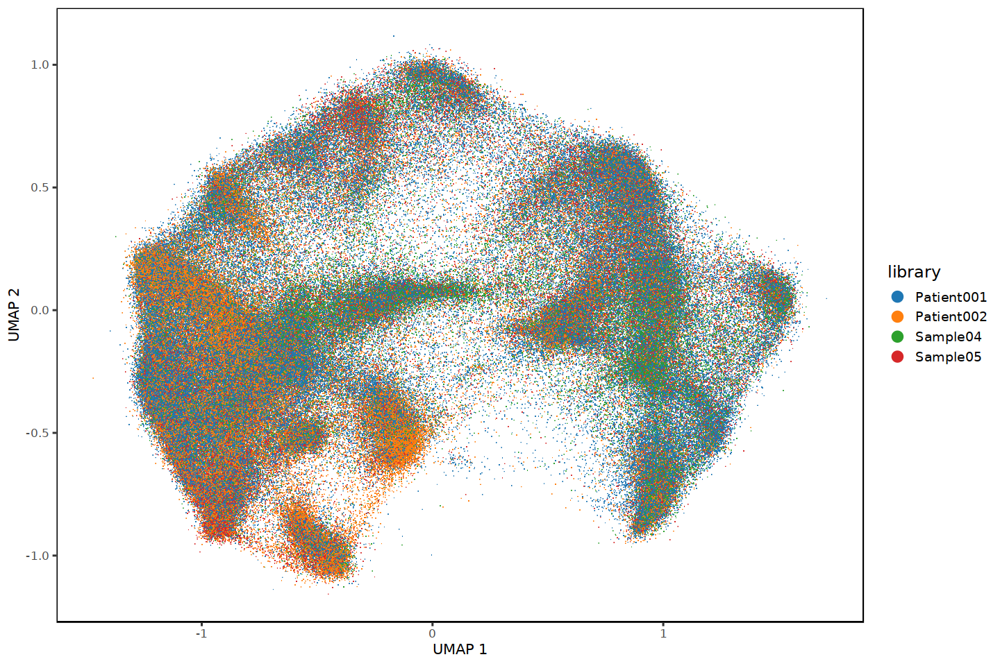

In [50]:
fig.size(8, 12)
i = which(!is.na(cells$meta_data$type_lvl2) & cells$meta_data$type_lvl2 != '')
# i = sample(setdiff(seq_len(nrow(meta_data)), which(is.na(meta_data$type_lvl1))), 1e5)
plt = do_scatter(
    dplyr::select(cells$meta_data, matches('UMAP._immune'))[i, ], 
    dplyr::select(cells$meta_data, !matches('UMAP._immune'))[i, ], 
    'library', do_labels = FALSE, do_raster = TRUE, no_guides = FALSE, 
    palette_use = pal$library
)  + 
    scale_color_manual(values = pal$library) ## do_scatter doesn't keep order of palette names
plt


In [51]:
ggsave('figures/s9c_umap_batches_fine_immune.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 8, width = 12)
ggsave('figures/s9c_umap_batches_fine_immune.png', plt, device = 'png', dpi = 300, units = 'in', height = 8, width = 12)


Warning message:
“Removed 1090967 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1090967 rows containing missing values (`geom_point()`).”


# Frequencies per donor

In [52]:
# fig.size(5, 15)
# ggplot(plt_df, aes(region, N, fill = type)) + 
# # ggplot(plt_df, aes(reorder(paste(region, library), lib_int), N, fill = type)) + 
#     geom_bar(stat = 'identity', position = position_stack()) + 
#     # coord_flip() + 
#     scale_fill_tableau('Classic 20') + 
#     facet_grid(.~region_type+library, scales = 'free', space = 'free') + 
#     # facet_grid(region_type+library~., scales = 'free', space = 'free') + 
#     NULL


# Colocalization inside hubs: heatmaps

In [208]:
# res = fread('tables/colocalization_stats.csv')



In [82]:
# # ## has stromal subtypes
# res_meta = fread('data/colocalization_stats_revision_meta.csv') 
# unique(res_meta$hubType)

In [44]:
# fread('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/data/colocalization_stats_meta_v3.csv')

In [101]:
## has T cell subtypes, no stromal subtypes 
res_meta = fread('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/data/colocalization_stats_meta_v3.csv')
res_meta= res_meta[
    , hubType := case_when(
        hubType == 'hybrid_hub' ~ 'stem_immunity', 
        hubType == 'immune_hub' ~ 'activated_immunity', 
        TRUE ~ hubType
    )
][]

res_meta$index_type[res_meta$index_type == 'CD4 T'] = 'TCF7- CD4 T'
res_meta$index_type[res_meta$index_type == 'CD8 T'] = 'TCF7- CD8 T'
res_meta$index_type[res_meta$index_type == 'ILC'] = 'Tgd/innate-like'

res_meta$type[res_meta$type == 'CD4 T'] = 'TCF7- CD4 T'
res_meta$type[res_meta$type == 'CD8 T'] = 'TCF7- CD8 T'
res_meta$type[res_meta$type == 'ILC'] = 'Tgd/innate-like'



In [102]:
res_meta = res_meta[
    , pval := exp(pnorm(-abs(zscore), log.p = TRUE, lower.tail = TRUE)), ## two-tailed    
    # , pval := exp(pnorm(-zscore, log.p = TRUE, lower.tail = TRUE)), ## one-tailed    
][
    , fdr := p.adjust(pval), by = hubType
][]

head(res_meta)

index_type,type,hubType,freq,zscore,pval,fdr
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Epithelial,MARCO+ Macrophage,tumor,0.128887794,6.6505048,1.460447e-11,9.492908e-09
Epithelial,MMP1+SOX4+ Myeloid,tumor,0.038458860,19.3273559,1.581068e-83,1.231652e-80
Epithelial,Vascular,tumor,0.120708132,12.7090603,2.633172e-37,1.982779e-34
Epithelial,LAMP3+CD1C+ DC,tumor,0.018717809,8.9370823,1.997903e-19,1.382549e-16
Epithelial,SPP1+ Macrophage,tumor,0.134005933,0.9595995,1.686284e-01,1.000000e+00
Epithelial,CXCL13+ CD8 T,tumor,0.007010505,2.5462444,5.444446e-03,1.000000e+00


In [84]:
# .hubtype = 'stem_immunity'
# # .hubtype = 'hybrid_hub'
# .title = 'fooooooo'
# .celltypes = NULL
# stat = 'zscore'

In [105]:
foo = function(.hubtype, .title, .celltypes = NULL, stat = 'zscore', fdr_thresh=.05) {
    X = res_meta[hubType == .hubtype]
    X$SCORE = X[[stat]]
    if (stat == 'zscore') {
        stat_max = 10        
    } else {
        stat_max = max(X$SCORE)
    }

    ## wide matrix of FDR values 
    X_fdr = X[, .(index_type, type, fdr)] %>%
        data.frame() %>% 
        tidyr::spread(type, fdr, fill = 1) %>% 
        # tidyr::spread(type, fdr, fill = NA) %>% 
        tibble::column_to_rownames('index_type') %>% 
        as.matrix() 

    ## wide matrix of zscores or frequencies 
    X = X[, .(index_type, type, SCORE)] %>%
        data.frame() %>% 
        tidyr::spread(type, SCORE, fill = 0) %>% 
        # tidyr::spread(type, SCORE, fill = NA) %>% 
        tibble::column_to_rownames('index_type') %>% 
        as.matrix() 
    if (!is.null(.celltypes))
        X = X[.celltypes, .celltypes]

    X = pmin(X, stat_max)
    o = hclust(dist(X))$order

    mat_text = matrix('', nrow = nrow(X), ncol = ncol(X))
    mat_text[X_fdr < fdr_thresh] = '*'
    mat_text = mat_text[o, o]

    plt = Heatmap(
        matrix = X[o, o], 
        rect_gp = gpar(col = "white", lwd = 2), 
        cluster_columns = FALSE, cluster_rows = FALSE, 
        name = stat,
        col = colorRamp2(c(-stat_max, 0, stat_max), c('blue', 'white', 'red')),
        # col = colorRamp2(c(-stat_max, 0, stat_max), c(muted('red'), 'white', muted('blue'))),
        # col = colorRamp2(c(-stat_max, 0, stat_max), c('white', 'white', muted('blue'))),
        column_title = .title,
        row_names_side = 'left', 
        cell_fun = function(j, i, x, y, w, h, col) { # add text to each grid
            grid.text(mat_text[i, j], x, y)
        }
    )

    plt <- grid.grabExpr(
        draw(
            plt, 
            padding = unit(c(15, 15, 2, 2), "mm"), #bottom, left, top, right paddings
        )    
    ) 
    plt <- wrap_elements(plt)
    plt    
}


Let's put those little asterisks inside boxes. 

In [86]:
# .hubtype = 'stem_immunity'
# .title = 'Stem-immunity Hub Colocalization'
# .celltypes = NULL
# stat = 'zscore'
# fdr_thresh = .01

In [106]:
# res_meta[
#     hubType == 'stem_immunity' & grepl('CXCL10', index_type)
#     # hubType == 'stem_immunity' & grepl('mreg', index_type)
# ][]


In [107]:
# res_meta %>% 
#     filter(type == 'Epithelial')

In [89]:
# # plt = foo('activated_immunity', 'Stem-immunity Hub Colocalization', stat = 'zscore', fdr_thresh = .01)
# plt = foo('stem_immunity', 'Stem-immunity Hub Colocalization', stat = 'zscore', fdr_thresh = .05)


# fig.size(10, 10)
# plt

In [108]:
fig.size(10, 10)
plt = foo('stem_immunity', 'Stem-immunity Hub Colocalization', stat = 'zscore')
# plt
ggsave('figures/6_coloc_heatmap_hybridhub_zscore.pdf', plt, device = 'pdf', units = 'in', width = 10, height = 10, dpi = 300)
ggsave('figures/6_coloc_heatmap_hybridhub_zscore.png', plt, device = 'png', units = 'in', width = 10, height = 10, dpi = 300)

plt = foo('stem_immunity', 'Stem-immunity Hub Colocalization', stat = 'freq')
# plt
ggsave('figures/6_coloc_heatmap_hybridhub_freq.pdf', plt, device = 'pdf', units = 'in', width = 10, height = 10, dpi = 300)
ggsave('figures/6_coloc_heatmap_hybridhub_freq.png', plt, device = 'png', units = 'in', width = 10, height = 10, dpi = 300)

In [109]:
fig.size(10, 10)
plt = foo('activated_immunity', 'Activated immunity Hub Colocalization', stat = 'zscore')
# plt
ggsave('figures/6_coloc_heatmap_immunityhub_zscore.pdf', plt, device = 'pdf', units = 'in', width = 10, height = 10, dpi = 300)
ggsave('figures/6_coloc_heatmap_immunityhub_zscore.png', plt, device = 'png', units = 'in', width = 10, height = 10, dpi = 300)
plt = foo('activated_immunity', 'Immunity Hub Colocalization', stat = 'freq')
# plt
ggsave('figures/6_coloc_heatmap_immunityhub_freq.pdf', plt, device = 'pdf', units = 'in', width = 10, height = 10, dpi = 300)
ggsave('figures/6_coloc_heatmap_immunityhub_freq.png', plt, device = 'png', units = 'in', width = 10, height = 10, dpi = 300)


In [110]:
fig.size(10, 10)
plt = foo('vascular', 'Vascular Hub Colocalization', stat = 'zscore')
# plt
ggsave('figures/6_coloc_heatmap_vascular_zscore.pdf', plt, device = 'pdf', units = 'in', width = 10, height = 10, dpi = 300)
ggsave('figures/6_coloc_heatmap_vascular_zscore.png', plt, device = 'png', units = 'in', width = 10, height = 10, dpi = 300)
plt = foo('vascular', 'Vascular Hub Colocalization', stat = 'freq')
# plt
ggsave('figures/6_coloc_heatmap_vascular_freq.pdf', plt, device = 'pdf', units = 'in', width = 10, height = 10, dpi = 300)
ggsave('figures/6_coloc_heatmap_vascular_freq.png', plt, device = 'png', units = 'in', width = 10, height = 10, dpi = 300)


In [ ]:
# fig.size(10, 10)
# plt = foo('tumor', 'Tumor Colocalization', stat = 'zscore')
# # plt
# ggsave('figures/6_coloc_heatmap_tumor_zscore.pdf', plt, device = 'pdf', units = 'in', width = 10, height = 10, dpi = 300)
# ggsave('figures/6_coloc_heatmap_tumor_zscore.png', plt, device = 'png', units = 'in', width = 10, height = 10, dpi = 300)
# plt = foo('tumor', 'Tumor Colocalization', stat = 'freq')
# # plt
# ggsave('figures/6_coloc_heatmap_tumor_freq.pdf', plt, device = 'pdf', units = 'in', width = 10, height = 10, dpi = 300)
# ggsave('figures/6_coloc_heatmap_tumor_freq.png', plt, device = 'png', units = 'in', width = 10, height = 10, dpi = 300)


## Special case: row annotation for main fig heatmap

In [52]:
# .celltypes = NULL
# .hubtype = 'hybrid_hub'
# .title = 'Stem-immunity Hub Colocalization'
# stat = 'zscore'
# annotation_name = 'Local Interaction'


# # foo = function(.hubtype, .title, .celltypes = NULL, stat = 'zscore') {
# X = res_meta[hubType == .hubtype]
# X[
#     , `:=`(
#         zscore = case_when(
#             fdr < .05 ~ zscore, 
#             TRUE ~ 0
#         ),
#         freq = case_when(
#             fdr < .05 ~ freq, 
#             TRUE ~ 0
#         )
#     )
# ][]
# X$SCORE = X[[stat]]
# if (stat == 'zscore') {
#     stat_max = 10        
# } else {
#     stat_max = max(X$SCORE)
# }

# X = X[, .(index_type, type, SCORE)] %>%
#     data.frame() %>% 
#     tidyr::spread(type, SCORE, fill = NA) %>% 
#     tibble::column_to_rownames('index_type') %>% 
#     as.matrix() 
# if (!is.null(.celltypes))
#     X = X[.celltypes, .celltypes]



# X = pmin(X, stat_max)
# o = hclust(dist(X))$order

# ## annotation colors
# ann = data.frame(row.names = rownames(X))
# ann[[annotation_name]] = ''
# ann[c('CD4 T', 'Treg', 'LAMP3+CCL19+ mreg DC'), annotation_name] = 'mregDC/CD4'
# ann[c('CD8 T', 'CXCL10+ Macrophage'), annotation_name] = 'CXCL10Mac/CD8'
# ann = ann[o, , drop = FALSE]
# ann_col = list(c('mregDC/CD4' = '#4E79A7', 'CXCL10Mac/CD8' = '#F28E2B'))
# names(ann_col) = annotation_name

# plt = Heatmap(
#     matrix = X[o, o], 
#     cluster_columns = FALSE, cluster_rows = FALSE, 
#     name = stat,
#     col = colorRamp2(c(-stat_max, 0, stat_max), c(muted('red'), 'white', muted('blue'))),
#     # col = colorRamp2(c(-stat_max, 0, stat_max), c('white', 'white', muted('blue'))),
#     column_title = .title,
#     row_names_side = 'left',
#     right_annotation = rowAnnotation(
#         df = ann, 
#         na_col = 'white', 
#         col = ann_col,
#         show_annotation_name = FALSE
#     )
# )

# plt <- grid.grabExpr(
#     draw(
#         plt, 
#         padding = unit(c(15, 15, 2, 2), "mm"), #bottom, left, top, right paddings
#     )    
# ) 
# plt <- wrap_elements(plt)
# plt    
# # }


In [53]:
# ggsave('figures/6_coloc_heatmap_hybridhub_zscore.pdf', plt, device = 'pdf', units = 'in', width = 10, height = 10, dpi = 300)
# ggsave('figures/6_coloc_heatmap_hybridhub_zscore.png', plt, device = 'png', units = 'in', width = 10, height = 10, dpi = 300)


# Colocalization (null histograms)

In [72]:
res = fread('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/data/colocalization_stats.csv')
library(stringr)
if ('freq_perm' %in% colnames(res)) {
    res$freq_perm = res$freq_perm %>% str_split('\\|') %>% map(as.numeric)    
}


# has T cell subtypes, no stromal subtypes 
# res = res[
#     , hubType := case_when(
#         hubType == 'hybrid_hub' ~ 'stem_immunity', 
#         hubType == 'immune_hub' ~ 'activated_immunity', 
#         TRUE ~ hubType
#     )
# ][]

res$index_type[res$index_type == 'CD4 T'] = 'TCF7- CD4 T'
res$index_type[res$index_type == 'CD8 T'] = 'TCF7- CD8 T'
res$index_type[res$index_type == 'ILC'] = 'Tgd/innate-like'

res$type[res$type == 'CD4 T'] = 'TCF7- CD4 T'
res$type[res$type == 'CD8 T'] = 'TCF7- CD8 T'
res$type[res$type == 'ILC'] = 'Tgd/innate-like'


res = res

In [81]:
res_meta %>% 
    filter(grepl('CD8', index_type)) %>% 
    split(.$index_type) %>% 
    map(arrange, -zscore) %>% 
    map(head)

,index_type,type,hubType,freq,zscore,pval,fdr
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,CXCL13+ CD8 T,TCF7- CD8 T,tumor,0.2092217,6.290521,1.582016e-10,4.736556e-07
2,CXCL13+ CD8 T,Treg,tumor,0.2095296,5.337539,4.710824e-08,1.369908e-04
3,CXCL13+ CD8 T,Tgd/innate-like,tumor,0.1301147,3.940763,4.061139e-05,1.092446e-01
4,CXCL13+ CD8 T,TCF7- CD8 T,vascular,0.2241629,3.603260,1.571255e-04,4.130830e-01
5,CXCL13+ CD8 T,TCF7- CD8 T,stem_immunity,0.4327050,3.414505,3.194899e-04,8.226864e-01
6,CXCL13+ CD8 T,CXCL10+ Macrophage,tumor,0.1334672,3.332411,4.304845e-04,1.000000e+00
,index_type,type,hubType,freq,zscore,pval,fdr
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,TCF7- CD8 T,Treg,tumor,0.19553607,12.690241,3.348963e-37,1.071333e-33


In [78]:
libs = unique(res$library)
for (lib in libs) {
    lib <<- lib
    foo = function(t1, t2) {
        .SD = res[hubType == 'hybrid_hub' & library == lib & index_type == t1 & type == t2] 
        if (.SD$fdr < .01) {
            .subtitle = glue('FDR={base::format(.SD$fdr, scientific=TRUE, digits=2)}')
        } else {
            .subtitle = glue('FDR={base::format(.SD$fdr, digits=2)}')
        }
        ggplot() + 
            geom_histogram(
                data = tibble(x = unlist(.SD$freq_perm)), 
                aes(x), 
                bins = 30
            ) + 
            geom_vline(
                data = tibble(x = .SD$freq), aes(xintercept = x), color = 'red'
            ) + 
            labs(
                # title = 'Permutation Distribution', subtitle = .SD$library, 
                # subtitle = glue('{.SD$index_type}'), 
                title = glue('{.SD$index_type}'), 
                subtitle = .subtitle, 
                x = glue('# {.SD$type} neighbors')
                # x = glue('#{.SD$type} near a {.SD$index_type}')
            ) + 
            # scale_x_log10() + 
            theme_bw(base_size = 12) + 
            NULL
    }

    fig.size(15, 8)
    (
        (
            foo('CXCL10+ Macrophage', 'TCF7- CD8 T') /
            foo('CXCL10+ Macrophage', 'TCF7+ CD8 T') /
            foo('CXCL10+ Macrophage', 'TCF7+PD1+ CD8 T') /
            foo('CXCL10+ Macrophage', 'TCF7- CD4 T') / 
            foo('CXCL10+ Macrophage', 'TCF7+ CD4 T') / 
            # foo('CXCL10+ Macrophage', 'CD8 T') /
            # foo('CXCL10+ Macrophage', 'CD4 T') / 
            foo('CXCL10+ Macrophage', 'Treg') 
        ) 
    ) | 
    (
            foo('LAMP3+CCL19+ mreg DC', 'TCF7- CD8 T') /
            foo('LAMP3+CCL19+ mreg DC', 'TCF7+ CD8 T') /
            foo('LAMP3+CCL19+ mreg DC', 'TCF7+PD1+ CD8 T') /
            foo('LAMP3+CCL19+ mreg DC', 'TCF7- CD4 T') / 
            foo('LAMP3+CCL19+ mreg DC', 'TCF7+ CD4 T') / 
            foo('LAMP3+CCL19+ mreg DC', 'Treg')
        # foo('LAMP3+CCL19+ mreg DC', 'CD4 T') / 
        # foo('LAMP3+CCL19+ mreg DC', 'Treg') / 
        # foo('LAMP3+CCL19+ mreg DC', 'CD8 T')
    ) + 
    plot_annotation(tag_levels = 'a')

    ggsave(glue('figures/Null_distributions_{lib}.pdf'), device = 'pdf', units = 'in', height = 15, width = 8)
    ggsave(glue('figures/Null_distributions_{lib}.png'), device = 'png', units = 'in', height = 15, width = 8)

}


# Hubs in space

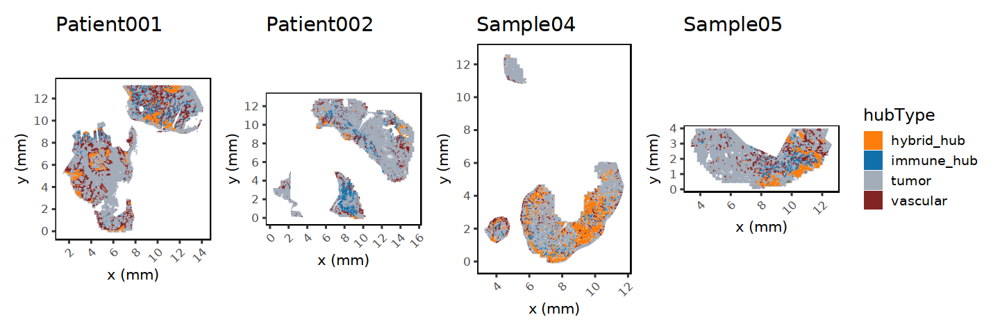

In [65]:
fig.size(4, 12)
plt = hubs$meta_data %>% 
    dplyr::mutate(shape = shape / 1000) %>% 
    split(.$library) %>% 
    imap(function(.SD, .lib) {
        plt = ggplot(.SD) + 
            geom_sf(color = NA) + 
            geom_sf(
                # data = hubs %>% subset(region_type %in% c('hybrid_hub', 'immune_hub')), 
                aes(fill = hubType), 
                color = NA
            ) + 
            scale_fill_manual(values = pal$hubType) + 
            # facet_wrap(~library, nrow = 1) +
            # labs()
            theme(
                axis.text.x = element_text(angle = 45, hjust = 1)
            ) + 
            labs(title = .lib, x = 'x (mm)', y = 'y (mm)') + 
            NULL
        if (.lib != 'Sample05')
            plt = plt + guides(fill = 'none')
        return(plt)
    }) %>% 
    purrr::reduce(`+`) + 
    plot_layout(nrow = 1, widths = c(1, 1, 1, 1))

plt
ggsave('figures/hubs_in_space_v1.png', plt, width = 12, height = 4, units = 'in', dpi = 300, device = 'png')
ggsave('figures/hubs_in_space_v1.pdf', plt, width = 12, height = 4, units = 'in', dpi = 300, device = 'pdf')


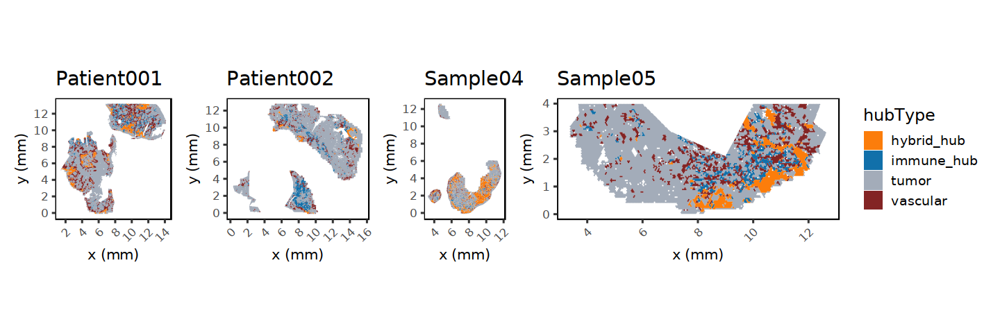

In [66]:
fig.size(4, 12)
plt = hubs$meta_data %>% 
    dplyr::mutate(shape = shape / 1000) %>% 
    split(.$library) %>% 
    imap(function(.SD, .lib) {
        plt = ggplot(.SD) + 
            geom_sf(color = NA) + 
            geom_sf(
                # data = hubs %>% subset(region_type %in% c('hybrid_hub', 'immune_hub')), 
                aes(fill = hubType), 
                color = NA
            ) + 
            scale_fill_manual(values = pal$hubType) + 
            # facet_wrap(~library, nrow = 1) +
            # labs()
            theme(
                axis.text.x = element_text(angle = 45, hjust = 1)
            ) + 
            labs(title = .lib, x = 'x (mm)', y = 'y (mm)') + 
            NULL
        if (.lib != 'Sample05')
            plt = plt + guides(fill = 'none')
        return(plt)
    }) %>% 
    purrr::reduce(`+`) + 
    plot_layout(nrow = 1) 

plt
ggsave('figures/hubs_in_space_v2.png', plt, width = 12, height = 4, units = 'in', dpi = 300, device = 'png')
ggsave('figures/hubs_in_space_v2.pdf', plt, width = 12, height = 4, units = 'in', dpi = 300, device = 'pdf')


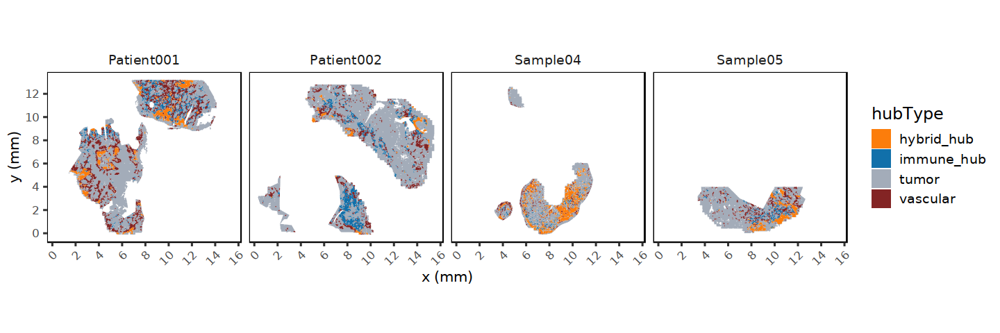

In [67]:
fig.size(4, 12)
plt = hubs$meta_data %>% 
    dplyr::mutate(shape = shape / 1000) %>% 
    ggplot() + 
        geom_sf(color = NA) + 
        geom_sf(
            # data = hubs %>% subset(region_type %in% c('hybrid_hub', 'immune_hub')), 
            aes(fill = hubType), 
            color = NA
        ) + 
        scale_fill_manual(values = pal$hubType) + 
        facet_wrap(~library, nrow = 1) +
        # labs()
        theme(
            axis.text.x = element_text(angle = 45, hjust = 1)
        ) + 
        labs(x = 'x (mm)', y = 'y (mm)') + 
        NULL

plt
ggsave('figures/hubs_in_space_v3.png', plt, width = 12, height = 4, units = 'in', dpi = 300, device = 'png')
ggsave('figures/hubs_in_space_v3.pdf', plt, width = 12, height = 4, units = 'in', dpi = 300, device = 'pdf')


# GeoMx vs MERFISH

In [68]:
geomx_comparison = fread('tables/geomx_vizgen_comparison.csv')


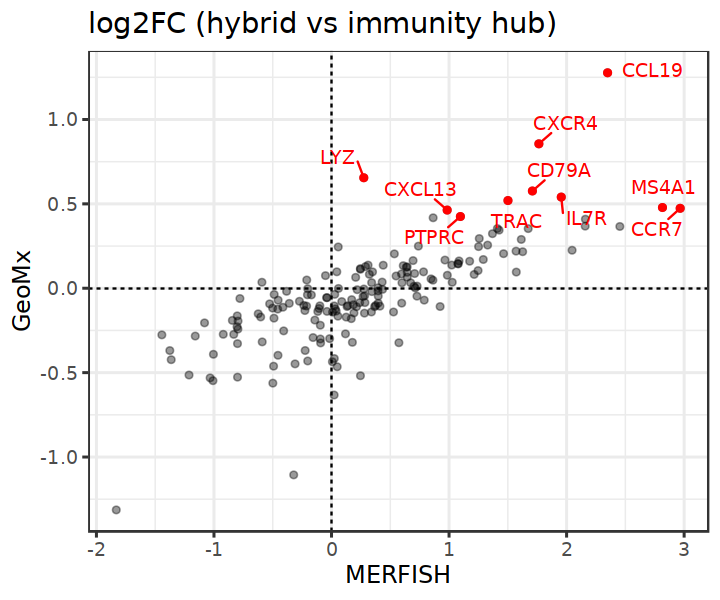

In [69]:
## Choose top 10 genes from GeoMx
genes_highlight = geomx_comparison[fdr_geomx < .01][order(-logFC_geomx)][1:10, gene]


set.seed(42L)
# ggplot(plt_df, aes(zscore, z)) + 
# genes_highlight <- c('LYZ', 'SPP1', 'C1QB', 'C1QA', 'CD14', 'CD163')
# genes_highlight <- c('CXCR4', 'SPP1', 'CCL19', 'CXCL9', 'CXCL10', 'CXCL11', 'CCR7', 'CXCR4')
plt = ggplot(geomx_comparison, aes(logFC_merfish, logFC_geomx)) + 
    # geom_abline() + 
    # geom_smooth(method = 'lm', se = FALSE, color = 'black') + 
    geom_hline(yintercept = 0, linetype = 2) + 
    geom_vline(xintercept = 0, linetype = 2) + 
    geom_point(alpha = .4) + 
    # geom_smooth(method = 'lm') + 
    labs(
        title = 'log2FC (hybrid vs immunity hub)',
        x = 'MERFISH', y = 'GeoMx'
    ) +
    scale_color_manual(values = c('black', 'red')) + 
    geom_point(
        data = . %>% subset(gene %in% genes_highlight),
        color = 'red'
    ) + 
    geom_text_repel(
        data = . %>% subset(gene %in% genes_highlight),
        aes(label = gene), 
        color = 'red',
        # min.segment.length = 10
        box.padding = .5
    ) + 
    guides(color = 'none') + 
    theme_bw(base_size = 14) + 
    NULL

fig.size(5, 6)
plt


In [70]:
cor.test(~logFC_merfish+logFC_geomx, geomx_comparison) %>% broom::tidy()


estimate,statistic,p.value,parameter,conf.low,conf.high,method,alternative
<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<chr>
0.7682022,15.87354,9.971312e-36,175,0.7000211,0.8225045,Pearson's product-moment correlation,two.sided


In [71]:
ggsave('figures/8i_geomx_vs_merfish_correlation.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 5, width = 6)
ggsave('figures/8i_geomx_vs_merfish_correlation.png', plt, device = 'png', dpi = 300, units = 'in', height = 5, width = 6)


# Visualize cells in hubs

First, let's find some good hubs by looking for cells with appropriate neighbors (LATER?)


In [72]:
# head(cells$meta_data)

# large_hubs = data.table(st_drop_geometry(hubs$meta_data))[library == 'Patient001' & hubType == 'hybrid_hub'][order(-ntiles)][1:10, ID]
# large_hubs = paste0('H', large_hubs)

# cells$meta_data[hubID %in% large_hubs & type_lvl1 != ''][
#     grepl('mreg|cxcl10|^cd4|^cd8|ilc|treg', type_lvl2, ignore.case = TRUE)
# ] %>% with(table(type_lvl2, hubID))


# set.seed(2)
# types_highlight = c('LAMP3+CCL19+ mreg DC', 'CD4 T', 'Treg')
# x = setdiff(unique(plt_df$type_lvl2), types_highlight)
# pal = c(
#     setNames(rep('lightgrey', length(x)), x),
#     setNames(
#         sample(tableau_color_pal()(10), length(types_highlight)),
#         types_highlight
#     )
# )

# fig.size(10, 15)
# plt_df %>% 
#     ggplot(aes(X, Y, color = type_lvl2)) + 
#         geom_point(size = 1) + 
#         # scale_color_tableau() +
#         scale_color_manual(values = pal) + 
#         NULL


# grep('CXCL', names(pal), value = TRUE)

# types_highlight = c('CD8 T', 'CXCL10+ Macrophage')
# x = setdiff(unique(plt_df$type_lvl2), types_highlight)
# pal = c(
#     setNames(rep('lightgrey', length(x)), x),
#     setNames(
#         sample(tableau_color_pal()(10), length(types_highlight)),
#         types_highlight
#     )
# )

# fig.size(10, 15)
# plt_df %>% 
#     ggplot(aes(X, Y, color = type_lvl2)) + 
#         geom_point(size = 1) + 
#         # scale_color_tableau() +
#         scale_color_manual(values = pal) + 
#         NULL



# Tile hex design 

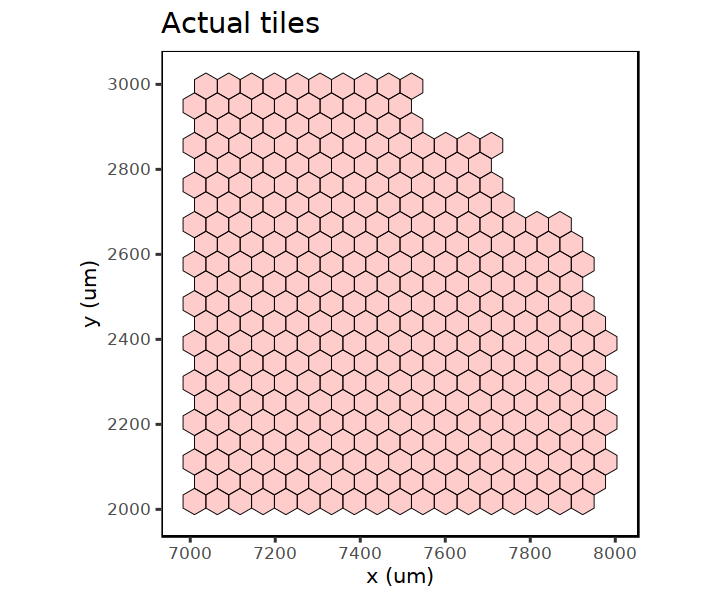

In [73]:
plt_df = tiles$meta_data %>% 
    cbind(shape = tiles$shapes) %>% 
    st_as_sf()


plt = ggplot() + 
    geom_sf(data = subset(plt_df, library == 'Sample04' & between(X, 7000, 8000) & between(Y, 2000, 3000)) %>% st_buffer(0), fill = 'red', alpha = .2, color = 'black') + 
    labs(title = 'Actual tiles', x = 'x (um)', y = 'y (um)') + 
    NULL
fig.size(5, 6)
plt


ggsave('figures/8b_tiles_hex_design.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 5, width = 6)
ggsave('figures/8b_tiles_hex_design.png', plt, device = 'png', dpi = 300, units = 'in', height = 5, width = 6)


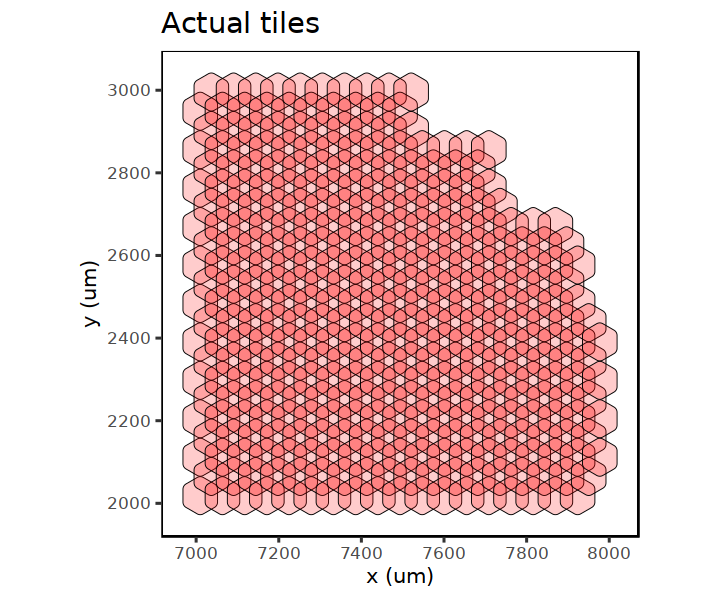

In [74]:
plt = ggplot() + 
    geom_sf(data = subset(plt_df, library == 'Sample04' & between(X, 7000, 8000) & between(Y, 2000, 3000)) %>% st_buffer(15), fill = 'red', alpha = .2, color = 'black') + 
    labs(title = 'Actual tiles', x = 'x (um)', y = 'y (um)') + 
    NULL
fig.size(5, 6)
plt


ggsave('figures/8b_tiles_hex_design_buffer.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 5, width = 6)
ggsave('figures/8b_tiles_hex_design_buffer.png', plt, device = 'png', dpi = 300, units = 'in', height = 5, width = 6)


# Tile QC histograms

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


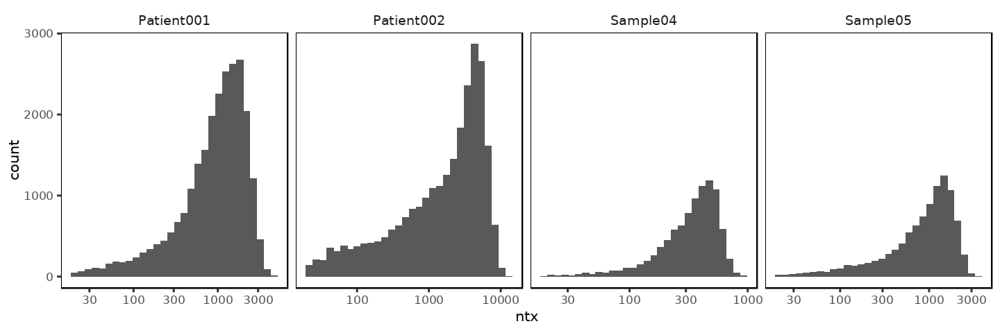

In [75]:
fig.size(4, 12)
plt = tiles$meta_data %>% 
    ggplot(aes(ntx)) + 
        geom_histogram() + 
        scale_x_log10() + 
        facet_wrap(~library, nrow = 1, scales = 'free_x') + 
        # geom_vline(xintercept = 20, linetype = 2) + 
        NULL
plt

In [76]:
ggsave('figures/8c_tiles_ntx_qc.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 4, width = 12)
ggsave('figures/8c_tiles_ntx_qc.png', plt, device = 'png', dpi = 300, units = 'in', height = 4, width = 12)


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


# Tile UMAPs

Warning message in geom_point(...):
“Ignoring unknown parameters: `width` and `height`”


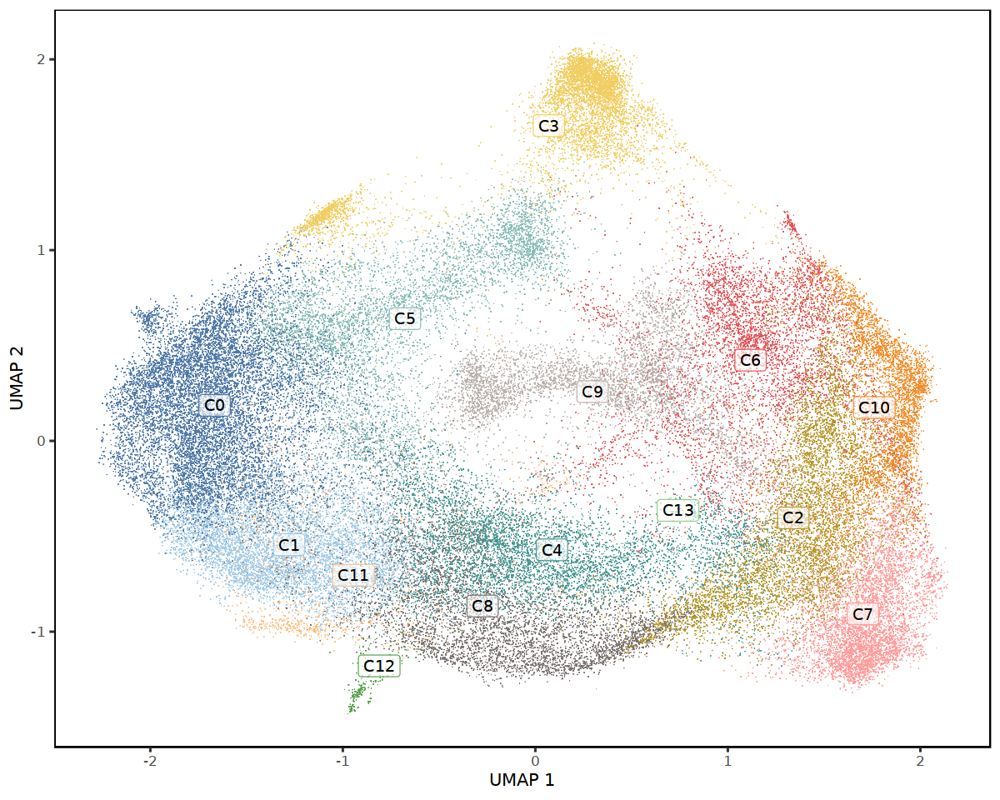

In [77]:
fig.size(8, 10)
# i = which(!is.na(cells$meta_data$type_lvl1) & cells$meta_data$type_lvl1 != '')
# i = sample(setdiff(seq_len(nrow(meta_data)), which(is.na(meta_data$type_lvl1))), 1e5)
plt = do_scatter(
    # tiles$U2$embedding, tiles$meta_data,
    dplyr::select(tiles$meta_data, matches('UMAP')), dplyr::select(tiles$meta_data, -matches('UMAP')),     
    'cluster', do_labels = TRUE, do_raster = TRUE, palette_use = tableau_color_pal('Tableau 20')(14)
) 
plt

ggsave('figures/s8d_umap_tiles_clusters.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 8, width = 10)
ggsave('figures/s8d_umap_tiles_clusters.png', plt, device = 'png', dpi = 300, units = 'in', height = 8, width = 10)



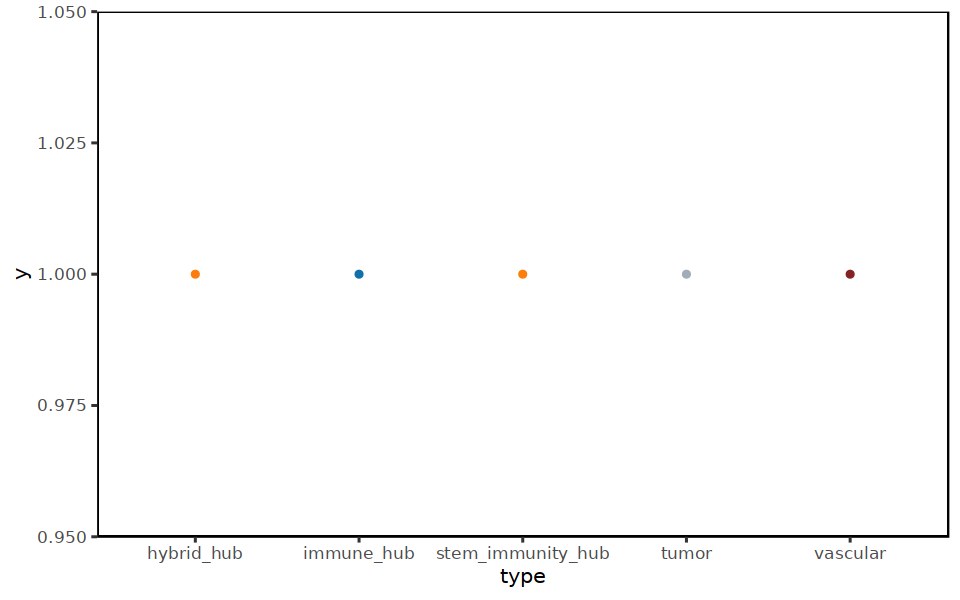

In [78]:
fig.size(5, 8)
data.frame(col = pal$hubType) %>% 
    tibble::rownames_to_column('type') %>% 
    ggplot(aes(type, 1)) + 
        geom_point(aes(color = col)) + 
        scale_color_identity()

Warning message in geom_point(...):
“Ignoring unknown parameters: `width` and `height`”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


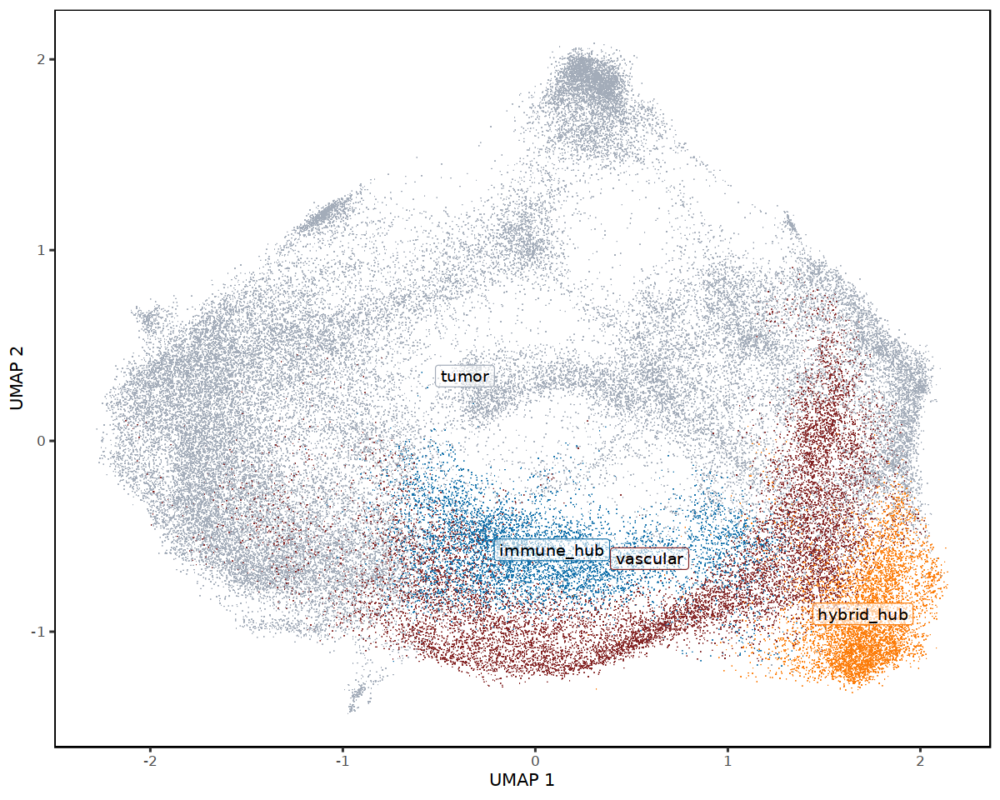

In [79]:
fig.size(8, 10)
# i = which(!is.na(cells$meta_data$type_lvl1) & cells$meta_data$type_lvl1 != '')
# i = sample(setdiff(seq_len(nrow(meta_data)), which(is.na(meta_data$type_lvl1))), 1e5)
plt = do_scatter(
    # tiles$U2$embedding, tiles$meta_data,
    dplyr::select(tiles$meta_data, matches('UMAP')), dplyr::select(tiles$meta_data, -matches('UMAP')), 
    'hubType', do_labels = TRUE, do_raster = TRUE, palette_use = pal$hubType
) + 
    scale_color_manual(values = pal$hubType) ## do_scatter doesn't keep order of palette names
plt

ggsave('figures/s8d_umap_tiles_labels.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 8, width = 10)
ggsave('figures/s8d_umap_tiles_labels.png', plt, device = 'png', dpi = 300, units = 'in', height = 8, width = 10)


# Cell QC histograms

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


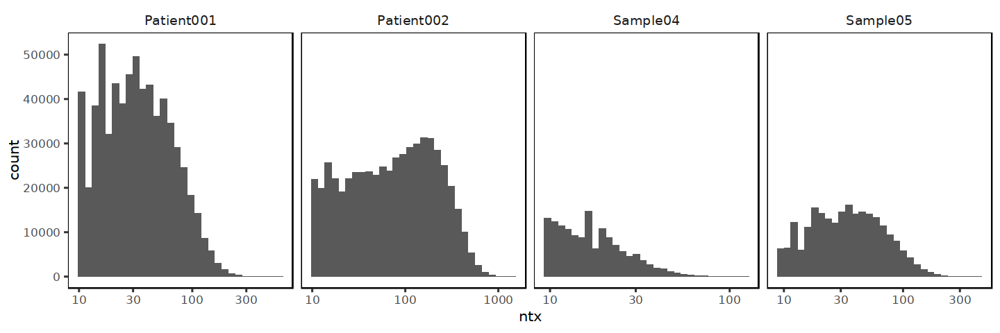

In [80]:
fig.size(4, 12)
plt = cells$meta_data %>% 
    ggplot(aes(ntx)) + 
        geom_histogram() + 
        scale_x_log10() + 
        facet_wrap(~library, nrow = 1, scales = 'free_x') + 
        # geom_vline(xintercept = 20, linetype = 2) + 
        NULL
plt

In [81]:
ggsave('figures/8c_cells_ntx_qc.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 4, width = 12)
ggsave('figures/8c_cells_ntx_qc.png', plt, device = 'png', dpi = 300, units = 'in', height = 4, width = 12)


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


# Tiles forest (CCL19 vs CXCL9/10/11)

In [82]:
effects_marginal = tiles$markers_clusters
effects_marginal$cluster = gsub('^C(.*)', '\\1', effects_marginal$cluster)

In [54]:
# plt <- full_join(
#     # data.table(effects_marginal)[feature %in% c('CXCL9', 'CXCL10', 'CXCL11'), .SD[order(-logFC)][2, ], by = .(cluster)][, feature := 'CXCL9_10_11'][], ## median
#     data.table(effects_marginal)[feature %in% c('CXCL9', 'CXCL10', 'CXCL11'), .SD[order(-logFC)][1, ], by = .(cluster)][, feature := 'CXCL9_10_11'][], ## max 
#     data.table(effects_marginal)[feature == 'CCL19', ],
#     # data.table(effects_marginal)[feature %in% c('CXCL9', 'CXCL10', 'CXCL11'), .SD[order(-logFC)][1, .(logFC, SD)], by = .(cluster)][, feature := 'CXCL9_10_11'][],
#     # data.table(effects_marginal)[feature == 'CCL19', .(feature, cluster, logFC, SD)],
#     by = c('cluster'), 
#     suffix = c('_CXCL9/10/11', '_CCL19')
# ) %>% 
#     ggplot(aes(`logFC_CXCL9/10/11`, logFC_CCL19)) + 
#         geom_point(
#             shape = 21, size = 2, 
#             aes(color = (`fdr_CXCL9/10/11` < .2 & `logFC_CXCL9/10/11` > 0) | (fdr_CCL19 < .2 & logFC_CCL19 > 0))
#         ) + 
#         geom_errorbarh(aes(
#             xmin = `logFC_CXCL9/10/11` - 1.96*`SD_CXCL9/10/11`, 
#             xmax = `logFC_CXCL9/10/11` + 1.96*`SD_CXCL9/10/11`,
#             color = `fdr_CXCL9/10/11` < .2 & `logFC_CXCL9/10/11` > 0
#         ), 
#             alpha = .5
#         ) + 
#         geom_errorbar(aes(
#             ymin = logFC_CCL19 - 1.96*SD_CCL19, 
#             ymax = logFC_CCL19 + 1.96*SD_CCL19,
#             color = fdr_CCL19 < .2 & logFC_CCL19 > 0
#         ), 
#             alpha = .5
#         ) + 
#         # geom_abline() + 
#         geom_hline(yintercept = c(0), linetype = 2) + 
#         geom_vline(xintercept = c(0), linetype = 2) + 
#         labs(color = 'FDR<20%\nlogFC>0') + 
#         geom_label_repel(
#             data = . %>% subset((`fdr_CXCL9/10/11` < .2 & `logFC_CXCL9/10/11` > 0) | (fdr_CCL19 < .2 & logFC_CCL19 > 0)),
#             aes(label = cluster),
#             size = 4, alpha = .8
#         ) +
#         # # geom_hline(yintercept = c(.5, .6), linetype = 2) + 
#         # # geom_vline(xintercept = c(.5, .6), linetype = 2) + 
#         # geom_point() + 
#         # geom_text_repel(aes(label = cluster)) + 
#         # labs(x = 'logFC CCL19', y = 'logFC CXCL9/10/11 (max)') + 
#         # # labs(x = 'auROC CCL19', y = 'auROC CXCL9/10/11') + 
#         scale_color_manual(values = c('black', 'red')) + 
#         theme_bw(base_size = 16) + 
#         NULL


# fig.size(5, 8)
# plt


In [84]:
# ggsave('figures/8g_tile_clusters_ccl19_vs_cxcl91011.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 5, width = 8)
# ggsave('figures/8g_tile_clusters_ccl19_vs_cxcl91011.png', plt, device = 'png', dpi = 300, units = 'in', height = 5, width = 8)


# Forest: TCF7+ PD1+ CD8 T cells vs CXCL9/10/11

In [36]:
stats_cells = fread('data/cache_lungcellabundance_tiles_stats.csv')[type_lvl2 == 'TCF7+ CD8 T']
# stats_cells = fread('data/cache_lungcellabundance_tiles_stats.csv')[grepl('PD1', type_lvl2)]

# stats_cells = fread('data/cache_lungcellabundance_tiles_stats.csv')[type_lvl2 == 'TCF7+ CD8 T']
stats_genes = tiles$markers_clusters[grepl('CXCL(9|10|11)', feature)]
stats_genes$cluster = gsub('^C(.*)', '\\1', stats_genes$cluster)
stats_genes = data.table(stats_genes)[feature %in% c('CXCL9', 'CXCL10', 'CXCL11'), .SD[order(-logFC)][1, ], by = .(cluster)][, feature := 'CXCL9_10_11'][] ## max 


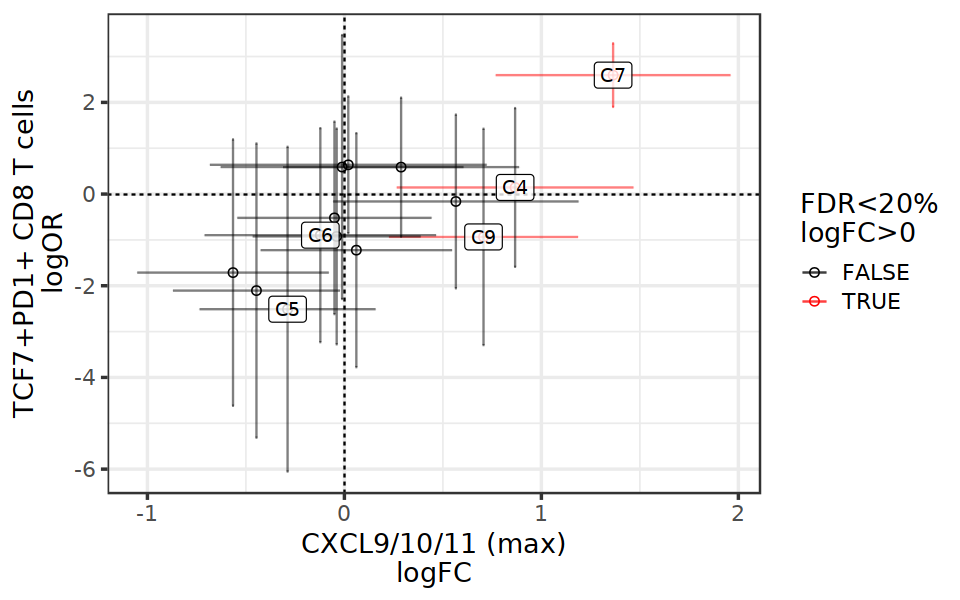

In [39]:
plt = full_join(
    stats_genes[, .(cluster, feature, logFC, SD, fdr)], 
    stats_cells[, .(cluster=hubType, feature=type_lvl2, logFC=logOR, SD, fdr)], 
    by = 'cluster', 
    suffix = c('_genes', '_cells')
) %>% 
    ggplot(aes(`logFC_genes`, logFC_cells)) + 
        geom_point(
            shape = 21, size = 2, 
            aes(color = (`fdr_genes` < .2 & `logFC_genes` > 0) | (fdr_cells < .2 & logFC_cells > 0))
        ) + 
        geom_errorbarh(aes(
            xmin = `logFC_genes` - 1.96*`SD_genes`, 
            xmax = `logFC_genes` + 1.96*`SD_genes`,
            color = `fdr_genes` < .2 & `logFC_genes` > 0
        ), 
            alpha = .5
        ) + 
        geom_errorbar(aes(
            ymin = logFC_cells - 1.96*SD_cells, 
            ymax = logFC_cells + 1.96*SD_cells,
            color = fdr_cells < .2 & logFC_cells > 0
        ), 
            alpha = .5
        ) + 
        # geom_abline() + 
        geom_hline(yintercept = c(0), linetype = 2) + 
        geom_vline(xintercept = c(0), linetype = 2) + 
        labs(color = 'FDR<20%\nlogFC>0') + 
        geom_label(
        # geom_label_repel(
            data = . %>% subset(
                (`fdr_genes` < .2 & `logFC_genes` > 0) |
                (fdr_cells < .2 & logFC_cells > 0) | 
                (cluster %in% c('C5', 'C6'))
            ),
            aes(label = cluster),
            size = 4, alpha = .8
        ) +
        # # geom_hline(yintercept = c(.5, .6), linetype = 2) + 
        # # geom_vline(xintercept = c(.5, .6), linetype = 2) + 
        # geom_point() + 
        # geom_text_repel(aes(label = cluster)) + 
        labs(y = 'TCF7+PD1+ CD8 T cells\nlogOR', x = 'CXCL9/10/11 (max)\nlogFC') + 
        # # labs(x = 'auROC CCL19', y = 'auROC CXCL9/10/11') + 
        scale_color_manual(values = c('black', 'red')) + 
        theme_bw(base_size = 16) + 
        NULL
    
fig.size(5, 8)
plt


In [40]:
ggsave('figures/8g_tile_clusters_tcf7pd1cd8_vs_cxcl91011.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 5, width = 8)
ggsave('figures/8g_tile_clusters_tcf7pd1cd8_vs_cxcl91011.png', plt, device = 'png', dpi = 300, units = 'in', height = 5, width = 8)


# Tile clusters C6 and C12 with hubs 

# Tile markers heatmap 

In [ ]:
g = tiles$markers_clusters[, .SD[order(-logFC)][1:10, ], by = cluster] %>% 
    with(unique(feature))

X = tiles$markers_clusters %>% 
    filter(feature %in% g) %>% 
    dplyr::select(cluster, feature, zscore) %>% 
    tidyr::spread(cluster, zscore) %>% 
    tibble::column_to_rownames('feature') %>% 
    as.matrix()
X = X[, hclust(dist(t(X)))$order]
X = X[order(max.col(X)), ]
colnames(X) = gsub('CC', 't', colnames(X))

In [ ]:
fig.size(5.5, 18)
plt = Heatmap(
    t(X), 
    row_names_side = 'left', 
    name = 'zscore',
    cluster_rows = FALSE, 
    cluster_columns = FALSE, 
)
plt <- grid.grabExpr(
    draw(
        plt, 
        padding = unit(c(2, 5, 2, 5), "mm"), #bottom, left, top, right paddings
    )    
) 
plt <- wrap_elements(plt)
plt    


In [ ]:
ggsave('figures/tile_markers_heatmap.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 5.5, width = 18)
ggsave('figures/tile_markers_heatmap.png', plt, device = 'png', dpi = 300, units = 'in', height = 5.5, width = 18)


# Cell markers heatmap 

In [10]:
# g = data.table(cells$markers_lvl2)[fdr < .01, .SD[order(-zscore)][1:5, ], by = cluster] %>% with(unique(g))

# g = union(
#     g, 
#     c(
#         'ERG','COL4A1','CSPG4','VWF','GJA4','MKI67','ZNF683','LAG3','CCL17',
#         'CCL22','GBP1','CXCL11','CCR8','IKZF2','CCR7','CD19','MS4A1','CD79A','VCAN',
#         'COL1A2','S100A9','KIT','CPA3','MS4A2','FCN1','S100A8','MMP1','KRT8','CCL8','LYVE1','ANPEP'
#     )
# )

# g = union(
#     g, 
#     c(
#         'CD1C', 'ITGAX', 'CD4', 'CD8A', 'CXCL10', 'CXCL13', 'FCN1', 'LYZ', 'FLT3', 'FOLR2', 'CD14', 
#         'TRDC', 'LAMP3', 'CCL19', 'MARCO', 'MERTK', 'MMP1', 'SOX4', 'NCAM1', 'S1010B', 'SEPP1', 'PLAG2G7', 'CCL18', 
#         'SPP1', 'TCF7', 'PDCD1', 'FOXP3'
#     )
# )
# length(g)

In [19]:
library(stringr)

In [22]:
cell_order = 'LAMP3+CCL19+ mreg DC
LAMP3+CD1C+ DC
FLT3+ DC
CD1C+ITGAX+ DC
CXCL10+ Macrophage
SPP1+ Macrophage
FCN1+LYZ+ Macrophage
PLA2G7+ CCL18+ Macrophage
FOLR2+CD14+ Macrophage
MARCO+ Macrophage
MERTK+ Macrophage
NCAM1+ S100B+ SEPP1+ Myeloid
MMP1+SOX4+ Myeloid
Mast
Vascular
Epithelial
Fibroblast
Plasma
B
NK
ILC
Treg
CD4 T
TCF7+ CD4 T
CXCL13+ CD4 T
TCF7+ CD8 T
TCF7+PD1+ CD8 T
CD8 T
CXCL13+ CD8 T'
cell_order = str_split(cell_order, '\n')[[1]]


g = 'ERG
COL4A1
CSPG4
VWF
GJA4
MERTK
IL2RA
C1QA
CD163
FOLR2
CD14
MKI67
TOP2A
CXCL13
ZNF683
LAG3
CD8A
LAMP3
FSCN1
IDO1
CCL17
CCL22
CXCL10
GBP1
CXCL9
CXCL11
CCR8
FOXP3
IKZF2
CD40LG
IL7R
CCR7
SELL
TCF7
CCL19
CD19
MS4A1
CD79A
VCAN
COL1A2
COL3A1
ZBTB16
NCAM1
SEPP1
PLA2G7
CD38
S100A9
KIT
CPA3
MS4A2
LYZ
FCN1
S100A8
ITGAX
IL18
CD1C
S100B
MMP1
CXCL8
VEGFA
KRT8
CCL8
LYVE1
SERPINA1
MARCO
ANPEP
MMP12
SPP1
CSF3R
HCK
GPNMB
ANGPT2
CXCL12
IL3RA
MMP9
TNFRSF4
BIRC3
SOX4
CD3E
GZMK
TNFRSF9
TOX
GNLY
CD3D
CD3G
FLT3
APOE
CCL18
CD4
C1QB
CCL18
PTLP
STAT1
ACTG2
MMP2
GPR183
BATF
CTLA4
TGFBR2
IL32
ISG20
BTLA
HMGB2
ITGAE'


g = str_split(g, '\n')[[1]]


In [36]:
X = cells$markers_lvl2 %>% 
    filter(feature %in% g) %>% 
    dplyr::select(cluster, feature, zscore) %>% 
    tidyr::spread(cluster, zscore) %>% 
    tibble::column_to_rownames('feature') %>% 
    as.matrix()




X = X[, cell_order]
# X = X[, hclust(dist(t(X)))$order]
X = X[order(max.col(X)), ]

colnames(X)[colnames(X) == 'TCF7+ CD8 T'] = 'TCF7+PD1- CD8 T'
colnames(X)[colnames(X) == 'CD8 T'] = 'TCF7- CD8 T'
colnames(X)[colnames(X) == 'CD4 T'] = 'TCF7- CD4 T'


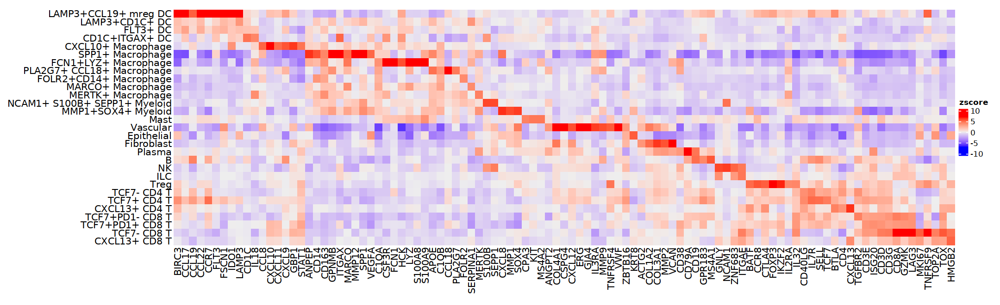

In [42]:
fig.size(5.5, 18)
plt = Heatmap(
    t(X), 
    row_names_side = 'left', 
    name = 'zscore',
    cluster_rows = FALSE, 
    cluster_columns = FALSE, 
)
plt <- grid.grabExpr(
    draw(
        plt, 
        padding = unit(c(2, 15, 2, 5), "mm"), #bottom, left, top, right paddings
    )    
) 
plt <- wrap_elements(plt)
plt    


In [ ]:
ggsave('figures/cell_markers_heatmap.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 5.5, width = 18)
ggsave('figures/cell_markers_heatmap.png', plt, device = 'png', dpi = 300, units = 'in', height = 5.5, width = 18)


# Correlation of chemokines

In [130]:
markers = fread('share/cells/markers_lvl2.csv')
head(markers)

cluster,feature,logFC,SD,zscore,pvalue,fdr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Vascular,FLT1,3.702223,0.2292544,16.14897,5.773750e-59,8.020316e-55
Vascular,CSPG4,3.891602,0.2443801,15.92438,2.146144e-57,1.490604e-53
Vascular,CD34,3.815226,0.2471464,15.43711,4.606895e-54,2.133146e-50
Vascular,DLL4,4.490232,0.2969250,15.12245,5.759009e-52,1.999960e-48
Vascular,NOTCH4,4.344039,0.2931495,14.81851,5.561206e-50,1.545014e-46
Vascular,VWF,5.362054,0.3788194,14.15464,8.741125e-46,2.023716e-42


In [165]:
g = grep('^IL\\d|^CCL|^CXCL|IFN', unique(markers$feature), value = TRUE)
g = g[!grepl('^IL\\d+R$', g)]
g = union(g, c('TNF', 'IFNG', 'INHBA', 'TGFB1', 'XCL1', 'IDO1'))


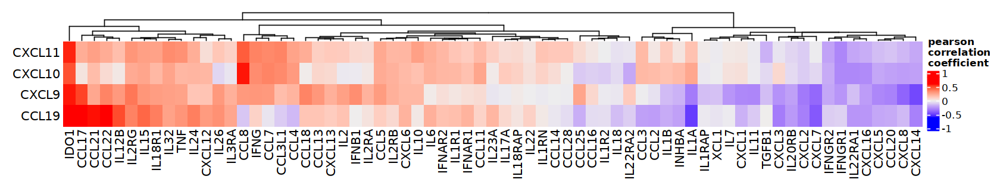

In [173]:
X = markers[
    feature %in% g, .(cluster, feature, logFC)
] %>% 
    tidyr::spread(cluster, logFC) %>% 
    tibble::column_to_rownames('feature') %>% 
    t() %>% cor()
fig.size(2.7, 14)
plt = Heatmap(
    X[
        c('CCL19', 'CXCL9', 'CXCL10', 'CXCL11'), 
        setdiff(rownames(X), c('CCL19', 'CXCL9', 'CXCL10', 'CXCL11'))
    ], 
    row_names_side = 'left', 
    name = 'pearson\ncorrelation\ncoefficient',
    show_row_dend = FALSE,
)
plt <- grid.grabExpr(
    draw(
        plt, 
        padding = unit(c(2, 2, 2, 5), "mm"), #bottom, left, top, right paddings
    )    
) 
plt <- wrap_elements(plt)
plt    


In [174]:
ggsave('figures/chemokines_heatmap.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 2.7, width = 14)
ggsave('figures/chemokines_heatmap.png', plt, device = 'png', dpi = 300, units = 'in', height = 2.7, width = 14)


# ETC

In [85]:
head(tiles$meta_data)

ID,library,X,Y,ntx,type,cluster,hubID,hubType,hubSize_ntiles,hubSize_um2,UMAP1,UMAP2
<chr>,<chr>,<dbl>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<int>,<dbl>,<dbl>,<dbl>
tile1723_Sample05,Sample05,3397.185,2802.635,24,other,C3,1,tumor,6381,15874263,0.4107962,1.8748382
tile1724_Sample05,Sample05,3397.185,2895.696,155,other,C6,1,tumor,6381,15874263,1.4892565,0.8416751
tile1725_Sample05,Sample05,3397.185,2988.756,82,other,C0,1,tumor,6381,15874263,-1.3419041,1.0337485
tile1726_Sample05,Sample05,3397.185,3081.817,271,other,C6,1,tumor,6381,15874263,0.8051733,0.2377155
tile1727_Sample05,Sample05,3397.213,3174.625,74,other,C3,1,tumor,6381,15874263,-0.9618404,1.2166743
tile1758_Sample05,Sample05,3424.050,2849.165,555,other,C2,16,vascular,15,37500,1.5580766,0.3389952


In [86]:
unique(tiles$meta_data$hubType)

[1] "tumor"      "vascular"   "immune_hub" "hybrid_hub"

In [87]:
tiles$meta_data %>% 
    subset(library == 'Sample04') %>% 
    subset(hubType == 'hybrid_hub') %>% 
    with(table(hubID)) %>% 
    sort()


hubID
1809 1811 1812 1814 1818 1819 1820 1826 1829 1831 1833 1835 1836 1837 1840 1841 
   1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1 
1842 1846 1848 1849 1850 1851 1855 1857 1858 1860 1861 1864 1866 1875 1876 1878 
   1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1 
1881 1884 1885 1889 1890 1897 1898 1901 1902 1904 1905 1907 1913 1916 1813 1817 
   1    1    1    1    1    1    1    1    1    1    1    1    1    1    2    2 
1821 1822 1843 1844 1845 1853 1854 1862 1863 1868 1870 1871 1872 1879 1882 1886 
   2    2    2    2    2    2    2    2    2    2    2    2    2    2    2    2 
1909 1912 1810 1823 1838 1839 1847 1859 1873 1880 1883 1891 1906 1908 1915 1824 
   2    2    3    3    3    3    3    3    3    3    3    3    3    3    3    4 
1865 1895 1896 1816 1867 1894 1911 1832 1852 1869 1874 1910 1899 1914 1815 1830 
   4    4    4    5    5    5    6    7    7    7    7    7    8    8   10   10 
1892 1834 1900 1888 18

In [88]:
head(tiles$meta_data)

ID,library,X,Y,ntx,type,cluster,hubID,hubType,hubSize_ntiles,hubSize_um2,UMAP1,UMAP2
<chr>,<chr>,<dbl>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<int>,<dbl>,<dbl>,<dbl>
tile1723_Sample05,Sample05,3397.185,2802.635,24,other,C3,1,tumor,6381,15874263,0.4107962,1.8748382
tile1724_Sample05,Sample05,3397.185,2895.696,155,other,C6,1,tumor,6381,15874263,1.4892565,0.8416751
tile1725_Sample05,Sample05,3397.185,2988.756,82,other,C0,1,tumor,6381,15874263,-1.3419041,1.0337485
tile1726_Sample05,Sample05,3397.185,3081.817,271,other,C6,1,tumor,6381,15874263,0.8051733,0.2377155
tile1727_Sample05,Sample05,3397.213,3174.625,74,other,C3,1,tumor,6381,15874263,-0.9618404,1.2166743
tile1758_Sample05,Sample05,3424.050,2849.165,555,other,C2,16,vascular,15,37500,1.5580766,0.3389952


In [89]:
hubs$meta_data %>% 
    subset(library == 'Sample04') %>% 
    subset(hubType == 'hybrid_hub') %>% 
    head()


Registered S3 method overwritten by 'geojson':
  method        from     
  print.geojson geojsonsf



,library,hubType,ID,ntiles,X,Y,area,shape
,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<GEOMETRY>
1142,Sample04,hybrid_hub,H1807,27,3803.171,1351.606,67500.009,POLYGON ((3705.663 1258.546...
1143,Sample04,hybrid_hub,H1808,36,3977.291,2349.421,90000.011,MULTIPOLYGON (((3786.256 18...
1144,Sample04,hybrid_hub,H1810,3,4010.125,1475.687,7500.001,POLYGON ((3974.306 1475.687...
1145,Sample04,hybrid_hub,H1813,2,4218.139,2715.157,4708.469,POLYGON ((4162.356 2728.617...
1146,Sample04,hybrid_hub,H1815,10,4463.235,2065.070,25000.003,"POLYGON ((4565.319 2034.05,..."
1147,Sample04,hybrid_hub,H1816,5,4533.082,1599.768,12500.002,MULTIPOLYGON (((4484.727 15...


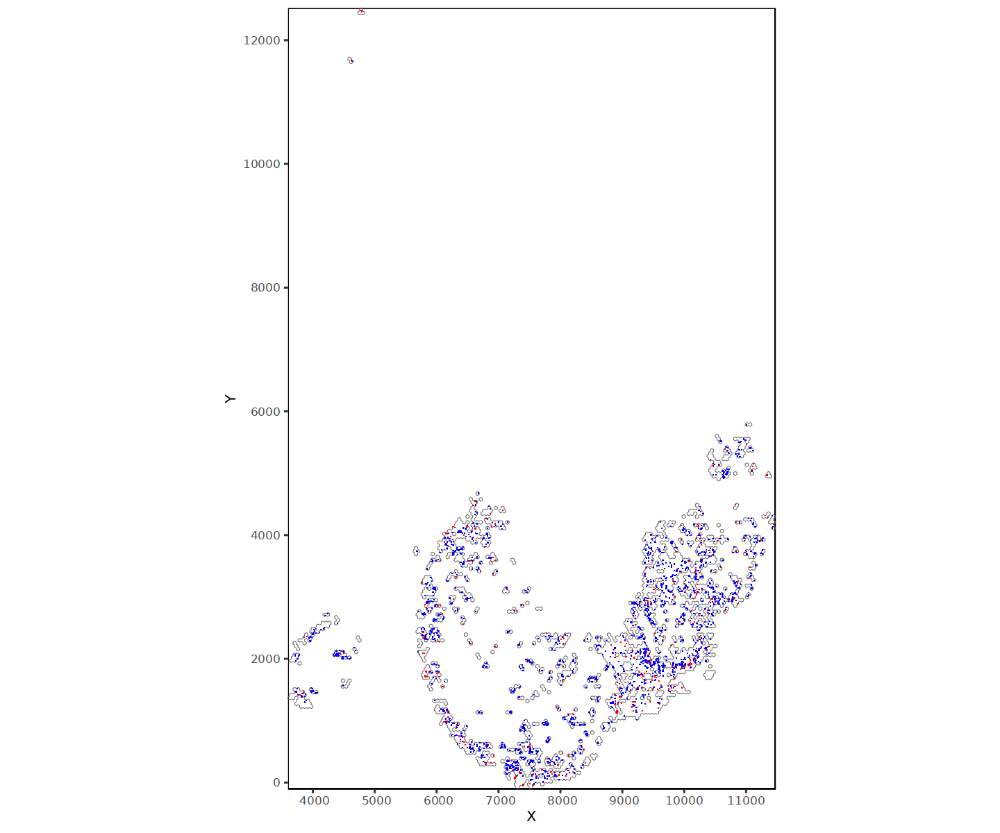

In [90]:
set.seed(1)
fig.size(10, 12)
hubs$meta_data %>% 
    subset(library == 'Sample04') %>% 
    subset(hubType == 'hybrid_hub') %>% 
    dplyr::mutate(ID = factor(ID, sample(unique(hubs$meta_data$ID)))) %>% 
    ggplot() +
        geom_sf(fill = NA) + 
        # geom_sf(aes(fill = ID), color = NA) + 
        geom_point(
            data = cells$meta_data[library == 'Sample04' & hubType == 'hybrid_hub' & grepl('mreg', type_lvl2)], 
            aes(X, Y),
            shape = '.', 
            color = 'red'
        ) + 
        geom_point(
            data = cells$meta_data[library == 'Sample04' & hubType == 'hybrid_hub' & grepl('CXCL10', type_lvl2, ignore.case = TRUE)], 
            aes(X, Y),
            shape = '.', 
            color = 'blue'
        ) + 
        coord_sf(expand = FALSE) + 
        guides(fill = 'none') + 
        NULL
    


In [91]:
#[, .N, by = .(hubID, hubSize_ntile)]


In [92]:
fig.size(10, 10)
tiles$meta_data %>% 
    cbind(shape = tiles$shapes) %>% 
    subset(library == 'Sample04') %>% 
    subset(hubType == 'hybrid_hub') %>% 
    ggplot() + 
        geom_sf(aes(geometry = shape)) + 
    

ERROR: Error in parse(text = x, srcfile = src): <text>:9:0: unexpected end of input
7:         geom_sf(aes(geometry = shape)) + 
8:     
  ^


In [ ]:
fread('share/tiles/markers_hubs.csv') %>% tail

In [ ]:
fread('share/hubs/markers.csv') %>% tail

# ETC 2

In [ ]:
fig.size(5, 8)
tiles$meta_data[, .N, by = library] %>% 
    ggplot(aes(library, N)) + 
        geom_bar(stat = 'identity') + 
        theme_bw(base_size = 20) + 
        labs(y = 'ntiles')


In [ ]:
ls()

In [ ]:
unique(hubs$meta_data$hubType)

In [ ]:
fig.size(10, 14)
hubs$meta_data %>% 
    ggplot() + 
        # geom_sf(aes(geometry = shape, fill = hubType == 'hybrid_hub'), color = 'lightgrey') + 
        geom_sf(aes(geometry = shape, fill = hubType), color = NA) + 
        facet_wrap(~library) + 
        # scale_fill_manual(values = c('white', 'red')) + 
        scale_fill_tableau() + 
        # guides(fill = 'none')
        NULL


In [4]:
df = fread('share/cells//meta_data.csv')

In [5]:
sort(unique(df$type_lvl2))

[1] ""                             "B"                           
 [3] "CD1C+ITGAX+ DC"               "CD4 T"                       
 [5] "CD8 T"                        "CXCL10+ Macrophage"          
 [7] "CXCL13+ CD4 T"                "CXCL13+ CD8 T"               
 [9] "Epithelial"                   "FCN1+LYZ+ Macrophage"        
[11] "Fibroblast"                   "FLT3+ DC"                    
[13] "FOLR2+CD14+ Macrophage"       "ILC"                         
[15] "LAMP3+CCL19+ mreg DC"         "LAMP3+CD1C+ DC"              
[17] "MARCO+ Macrophage"            "Mast"                        
[19] "MERTK+ Macrophage"            "MMP1+SOX4+ Myeloid"          
[21] "NCAM1+ S100B+ SEPP1+ Myeloid" "NK"                          
[23] "PLA2G7+ CCL18+ Macrophage"    "Plasma"                      
[25] "SPP1+ Macrophage"             "TCF7+ CD4 T"                 
[27] "TCF7+ CD8 T"                  "TCF7+PD1+ CD8 T"             
[29] "Treg"                         "Vascular"

In [6]:
head(df)

cell,library,X,Y,ntx,ngene,nblank,hubID,hubSize_tiles,hubSize_um2,hubType,type_lvl1,type_lvl2,UMAP1_all,UMAP2_all,UMAP1_immune,UMAP2_immune
<int>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,Patient001,7086.414,79.414864,30,23,0,R686,66,165000,tumor,Epithelial,Epithelial,0.6343959,0.154633419,NA,NA
2,Patient001,7090.282,-74.397942,16,14,0,R490,233,542538,tumor,Lymphocyte,B,-1.5597103,0.002063452,0.6360152,0.5448408
3,Patient001,7087.515,-21.805606,15,12,1,R490,233,542538,tumor,Epithelial,Epithelial,0.8468631,0.231922747,NA,NA
4,Patient001,7099.331,-17.703966,29,20,0,R490,233,542538,tumor,Epithelial,Epithelial,1.0996897,0.321722211,NA,NA
5,Patient001,7100.477,-9.060024,29,16,1,R490,233,542538,tumor,Epithelial,Epithelial,0.9649788,0.678280176,NA,NA
6,Patient001,7093.215,-5.783358,31,22,0,R490,233,542538,tumor,Epithelial,Epithelial,1.0787352,0.278981359,NA,NA


In [8]:
df[type_lvl2 != ''][, .N, by = .(type_lvl2, library, hubType)] %>% 
    fwrite('tables/cells_hubs_counts.csv')

# Tiles: ITGAX HLA

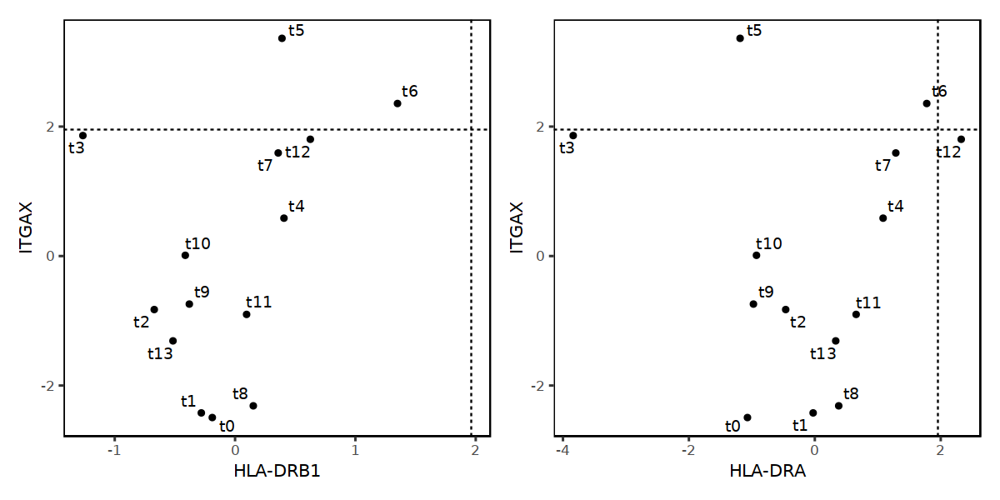

In [76]:
fig.size(5, 10)
plt = tiles$markers_clusters[
    feature %in% c('ITGAX', 'HLA-DRB1'), .(cluster, feature, zscore)
] %>% 
    tidyr::spread(feature, zscore) %>% 
    dplyr::mutate(cluster = gsub('CC', 't', cluster)) %>% 
    ggplot(aes(`HLA-DRB1`, ITGAX)) + 
        geom_vline(xintercept = 1.96, linetype = 2) + 
        geom_hline(yintercept = 1.96, linetype = 2) + 
        geom_point() + 
        geom_text_repel(aes(label = cluster)) + 
        NULL | 

tiles$markers_clusters[
    feature %in% c('ITGAX', 'HLA-DRA'), .(cluster, feature, zscore)
] %>% 
    tidyr::spread(feature, zscore) %>% 
    dplyr::mutate(cluster = gsub('CC', 't', cluster)) %>% 
    ggplot(aes(`HLA-DRA`, ITGAX)) + 
        geom_vline(xintercept = 1.96, linetype = 2) + 
        geom_hline(yintercept = 1.96, linetype = 2) + 
        geom_point() + 
        geom_text_repel(aes(label = cluster)) + 
        NULL
plt

In [ ]:
ggsave('figures/itgax_hla_zscores_tiles.pdf', plt, device = 'pdf', dpi = 300, units = 'in', height = 5, width = 10)
ggsave('figures/itgax_hla_zscores_tiles.png', plt, device = 'png', dpi = 300, units = 'in', height = 5, width = 10)


# Table: final colocalization stats meta

In [45]:
df = fread('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/data/colocalization_stats_revision_meta.csv')


In [ ]:
df$

In [ ]:
df[
    , index_type := case_when(
        index_type == 'CD4 T' ~ 'TCF7- CD4'
    )
]

In [ ]:

df$type

In [ ]:
df[
    , index_type := case_when(
    
    )
]

In [ ]:
df$index_type[cells$meta_data$type_lvl2 == 'CD4 T'] = 'TCF7- CD4 T'
df$index_type[cells$meta_data$type_lvl2 == 'CD8 T'] = 'TCF7- CD8 T'
cells$meta_data$type_lvl2[cells$meta_data$type_lvl2 == 'ILC'] = 'Tgd/innate-like'


In [15]:
df = fread('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/data/colocalization_stats_revision.csv')
df = df[grepl('\\+$|Venous|Arterial|peri', index_type, ignore.case = TRUE)]
df$index_type[grep('\\+$', df$index_type)] = paste0(df$index_type[grep('\\+$', df$index_type)], ' Fibroblast')
df$type[grep('\\+$', df$type)] = paste0(df$type[grep('\\+$', df$type)], ' Fibroblast')


In [17]:
df = fread('/n/data1/bwh/medicine/korsunsky/lab/ik97/NirMerfish/data/colocalization_stats.csv')

In [ ]:
df[
    , `:=`(
        index_type = case_when(
            
        )
    )
]

In [19]:
writeLines(sort(unique(df$index_type)))

B
CD1C+ITGAX+ DC
CD4 T
CD8 T
CXCL10+ Macrophage
CXCL13+ CD4 T
CXCL13+ CD8 T
Epithelial
FCN1+LYZ+ Macrophage
Fibroblast
FLT3+ DC
FOLR2+CD14+ Macrophage
ILC
LAMP3+CCL19+ mreg DC
LAMP3+CD1C+ DC
MARCO+ Macrophage
Mast
MERTK+ Macrophage
MMP1+SOX4+ Myeloid
NCAM1+ S100B+ SEPP1+ Myeloid
NK
PLA2G7+ CCL18+ Macrophage
Plasma
SPP1+ Macrophage
TCF7+ CD4 T
TCF7+ CD8 T
TCF7+PD1+ CD8 T
Treg
Vascular
